RETO 2 APAU - CLUSTERIZACIÓN

# Importación Librerias

In [ ]:
import pandas as pd
import csv
import re
from string import punctuation
from nltk.corpus import stopwords
import unicodedata
from collections import Counter
import emoji

# Libreria para vectorizar texto
from sklearn.feature_extraction.text import TfidfVectorizer

# Librerias para el clustering

from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import silhouette_samples, silhouette_score
import seaborn as sns
import matplotlib.pyplot as plt

# Librerias para reduccion de dimensionalidad
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA






# Funciones Utilizadas

In [ ]:
# Convertimos a minusculas, sacamos enlaces etc...
def preprocess_text(text):
    text = text.lower()  # Lowercase text
    text = re.sub(r"https?://\S+", "", text)
    text = re.sub(r"\b[0-9]+\b\s*", "", text)
    text = re.sub(r"@[\w]+", "", text)  # Eliminar menciones de usuario
    text = re.sub(r"[^a-zA-Záéíóúüñ\s]", "", text)  # Eliminar caracteres no alfabéticos
    text = re.sub(f"[{re.escape(punctuation)}]", "", text)  # Remove punctuation
    text = " ".join(text.split())  # Remove extra spaces, tabs, and new lines
    return text

# Función para eliminar stopwords
def remove_stopwords(text):
    # Convertir texto a minúsculas y eliminar acentos
    text = unicodedata.normalize('NFD', text).encode('ascii', 'ignore').decode('utf-8')
    return " ".join([word for word in str(text).lower().split() if word not in STOPWORDS])

def convert_emoji_to_text(emoji_text):
    text_with_aliases = emoji.demojize(emoji_text, delimiters=(":", ":"))
    return text_with_aliases



def Plot2D (samples_2D, title, axes = {'x': 'x', 'y': 'y'}):

  """
  samples_2D (numpy.ndarray): array tipo embedding cuyo
        shape es (num_muestras, 2) ; 2 por las dos coordenadas

  title(string): titulo de la figura que se utiliza para el plot
  """

  df_samples_2D = pd.DataFrame(data=samples_2D, columns=[axes['x'], axes['y']])

  sns.set(font_scale=3)
  sns.set(rc={'figure.figsize':(10,10)})
  sns.relplot(data=df_samples_2D,
              x=axes['x'],
              y=axes['y'],
              height=10, legend="full", palette="bright")

  set_size_letters(title,
                   axes['x'],
                   axes['y'],
                   active_legend = False)
  plt.axis('equal')

def set_size_letters(title, x_name, y_name, title_size = 20, x_size = 18, y_size = 18, active_legend = True, legend_size = 14):

  """
  Parameters:
    title (string): titulo del plot a representar

    x_name (string): nombre del eje x

    y_name (string): nombre del eje y

    active_legend (bool): indica si mostramos la leyenda o no. Por defecto True

    x_size, y_size, legend_size: tamaño de fuente de eje x, y, leyenda

  """

  plt.title(title, fontsize=title_size)
  plt.xlabel(x_name, fontsize=x_size)
  plt.ylabel(y_name, fontsize=y_size)
  if (active_legend == True):
    plt.legend(fontsize=legend_size)





# 1. Archivo APAUtweets.txt

## 1.1 Carga de Datos

In [ ]:
dataset_tweet = pd.read_csv("APAUtweets.txt", header=None, delimiter = "\t", encoding = 'utf8', quoting=csv.QUOTE_NONE)
dataset_tweet.set_index(0, inplace = True)
dataset_tweet.rename(columns={1: "text"}, inplace = True)
dataset_tweet

,text
0,
0,La Gran Guerra de #JuegoDeTronos nos ha dejado...
1,El golpe de Estado en #Venezuela está más lejo...
2,No tengo una foto en la catedral de #NotreDame...
3,#NotreDame nunca llegue a visitar tan grandios...
4,A tomar por culo mi crush 😭😭😭😭😭#JuegoDeTronos
...,...
8218,"#ChampionsLeague 83’ Gooooooool de Messi, que ..."
8219,Llegarán más venezolanos y la crisis humanitar...
8220,Hoy estamos de fiesta y deberías visitarnos. #...


## 1.2 Limpiar y procesar dataset

In [ ]:
dataset_tweet["text_lower"] = dataset_tweet["text"].map(preprocess_text) # Se aplica la función preprocess_text a la columna text

## 1.3 Borramos palabras tipicas

In [ ]:
# Lista de stopwords en español
STOPWORDS = set(stopwords.words('spanish'))
# Aplicar la función a la columna del dataset
dataset_tweet["text_stopW"] = dataset_tweet["text_lower"].apply(remove_stopwords)

dataset_tweet


,text,text_lower,text_stopW
0,,,
0,La Gran Guerra de #JuegoDeTronos nos ha dejado...,la gran guerra de juegodetronos nos ha dejado ...,gran guerra juegodetronos dejado momentos recu...
1,El golpe de Estado en #Venezuela está más lejo...,el golpe de estado en venezuela está más lejos...,golpe venezuela mas lejos final elif venezuela...
2,No tengo una foto en la catedral de #NotreDame...,no tengo una foto en la catedral de notredame ...,foto catedral notredame secuencia hermosa
3,#NotreDame nunca llegue a visitar tan grandios...,notredame nunca llegue a visitar tan grandiosa...,notredame nunca llegue visitar tan grandiosa c...
4,A tomar por culo mi crush 😭😭😭😭😭#JuegoDeTronos,a tomar por culo mi crush juegodetronos,tomar culo crush juegodetronos
...,...,...,...
8218,"#ChampionsLeague 83’ Gooooooool de Messi, que ...",championsleague gooooooool de messi que pedazo...,championsleague gooooooool messi pedazo gol ma...
8219,Llegarán más venezolanos y la crisis humanitar...,llegarán más venezolanos y la crisis humanitar...,llegaran mas venezolanos crisis humanitaria pu...
8220,Hoy estamos de fiesta y deberías visitarnos. #...,hoy estamos de fiesta y deberías visitarnos dí...,hoy fiesta deberias visitarnos diadellibro dia...


## 1.4 Contamos palabras que más se repiten

In [ ]:
#Contamos las palabras más comunes utilizadas en los tweets, nos sirve para tener una idea de los temas más comunes en los tweets y para procesar nuevas palabras que no estén en el diccionario de stopwords
cnt = Counter()
for text in dataset_tweet["text_stopW"].values:
    for word in text.split():
        cnt[word] += 1
        
cnt.most_common(20)

[('user', 2887),
 ('juegodetronos', 1195),
 ('diadellibro', 1181),
 ('championsleague', 1180),
 ('elecccionesgeneralesa', 1158),
 ('notredame', 1128),
 ('venezuela', 1127),
 ('mas', 919),
 ('hoy', 673),
 ('si', 663),
 ('gretathunberg', 612),
 ('messi', 567),
 ('laliga', 560),
 ('mejor', 498),
 ('ver', 457),
 ('libro', 408),
 ('dia', 405),
 ('gameofthrones', 386),
 ('barcelona', 377),
 ('mundo', 366)]

In [70]:
#Cargar stopwords en español y agregar palabras personalizadas
STOPWORDS = set(stopwords.words('spanish'))
STOPWORDS.update(["user","mas", "hoy", "si", "mejor", "dia", "mundo"])  # Agrega palabras específicas

dataset_tweet["text_stopW"] = dataset_tweet["text_lower"].apply(remove_stopwords)


In [71]:
# Contar palabras más frecuentes
cnt = Counter()
for text in dataset_tweet["text_stopW"].values:
    for word in text.split():
        cnt[word] += 1

# Mostrar las 15 palabras más comunes
cnt.most_common(15)

[('juegodetronos', 1195),
 ('diadellibro', 1181),
 ('championsleague', 1180),
 ('elecccionesgeneralesa', 1158),
 ('notredame', 1128),
 ('venezuela', 1127),
 ('gretathunberg', 612),
 ('messi', 567),
 ('laliga', 560),
 ('ver', 457),
 ('libro', 408),
 ('gameofthrones', 386),
 ('barcelona', 377),
 ('solo', 361),
 ('capitulo', 330)]

## 1.5 Convertimos los emojis a texto

In [ ]:
#Passing both functions to 'text_rare'
dataset_tweet['text_rare'] = dataset_tweet['text_stopW'].apply(convert_emoji_to_text)

dataset_tweet

,text,text_lower,text_stopW,text_rare
0,,,,
0,La Gran Guerra de #JuegoDeTronos nos ha dejado...,la gran guerra de juegodetronos nos ha dejado ...,gran guerra juegodetronos dejado momentos recu...,gran guerra juegodetronos dejado momentos recu...
1,El golpe de Estado en #Venezuela está más lejo...,el golpe de estado en venezuela está más lejos...,golpe venezuela lejos final elif venezuelaenba...,golpe venezuela lejos final elif venezuelaenba...
2,No tengo una foto en la catedral de #NotreDame...,no tengo una foto en la catedral de notredame ...,foto catedral notredame secuencia hermosa,foto catedral notredame secuencia hermosa
3,#NotreDame nunca llegue a visitar tan grandios...,notredame nunca llegue a visitar tan grandiosa...,notredame nunca llegue visitar tan grandiosa c...,notredame nunca llegue visitar tan grandiosa c...
4,A tomar por culo mi crush 😭😭😭😭😭#JuegoDeTronos,a tomar por culo mi crush juegodetronos,tomar culo crush juegodetronos,tomar culo crush juegodetronos
...,...,...,...,...
8218,"#ChampionsLeague 83’ Gooooooool de Messi, que ...",championsleague gooooooool de messi que pedazo...,championsleague gooooooool messi pedazo gol ma...,championsleague gooooooool messi pedazo gol ma...
8219,Llegarán más venezolanos y la crisis humanitar...,llegarán más venezolanos y la crisis humanitar...,llegaran venezolanos crisis humanitaria puede ...,llegaran venezolanos crisis humanitaria puede ...
8220,Hoy estamos de fiesta y deberías visitarnos. #...,hoy estamos de fiesta y deberías visitarnos dí...,fiesta deberias visitarnos diadellibro diainte...,fiesta deberias visitarnos diadellibro diainte...


In [73]:
#Se eliminan los emojis de los tweets


#def erase_emoji(emoji_text):
#    texto_sin_emojis = emoji.replace_emoji(emoji_text, replace='')
#    return texto_sin_emojis



# Passing both functions to 'text_rare'
#dataset_tweet['text_rare'] = dataset_tweet['text_stopW'].apply(erase_emoji)


## 1.6 World Embedding con TfidVectorizer

In [ ]:
lista_descriptiva = dataset_tweet["text_rare"]
vectorizer = TfidfVectorizer(use_idf=False, min_df=.0005)
matrix = vectorizer.fit_transform(lista_descriptiva)
matrix_text = pd.DataFrame(matrix.toarray(), columns=vectorizer.get_feature_names_out())
samples = matrix_text
samples

,abajo,abascal,abr,abrazo,abre,abril,abrir,absoluta,absolutamente,absoluto,...,winterfell,winterfellbattle,winterishere,worldbookday,xd,xxi,ynwa,youthforclimate,zona,zonas
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8218,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8219,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8220,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8221,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 1.7 KMEANS sin PCA

In [ ]:
#calculo kmeans del texto sin aplicar PCA para demostrar que si no aplicamos PCA para reducir dimensiones, el silhouette score es muy bajo debido a la maldición de la dimensionalidad.
for i in range(2,20):
    km = KMeans(n_clusters=i, init='random', max_iter=200, random_state=0).fit(samples)
    sample_km = km.labels_
    print("cantidad de cluster:", i)
    print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(samples, sample_km))

cantidad de cluster: 2
Silhouette Coefficient: 0.025
cantidad de cluster: 3
Silhouette Coefficient: 0.038
cantidad de cluster: 4
Silhouette Coefficient: 0.049
cantidad de cluster: 5
Silhouette Coefficient: 0.057
cantidad de cluster: 6
Silhouette Coefficient: 0.069
cantidad de cluster: 7
Silhouette Coefficient: 0.075
cantidad de cluster: 8
Silhouette Coefficient: 0.067
cantidad de cluster: 9
Silhouette Coefficient: 0.072
cantidad de cluster: 10
Silhouette Coefficient: 0.063
cantidad de cluster: 11
Silhouette Coefficient: 0.056
cantidad de cluster: 12
Silhouette Coefficient: 0.058
cantidad de cluster: 13
Silhouette Coefficient: 0.067
cantidad de cluster: 14
Silhouette Coefficient: 0.062
cantidad de cluster: 15
Silhouette Coefficient: 0.049
cantidad de cluster: 16
Silhouette Coefficient: 0.051
cantidad de cluster: 17
Silhouette Coefficient: 0.054
cantidad de cluster: 18
Silhouette Coefficient: 0.039
cantidad de cluster: 19
Silhouette Coefficient: 0.050


## 1.8 Reducción por PCA


C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:18: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



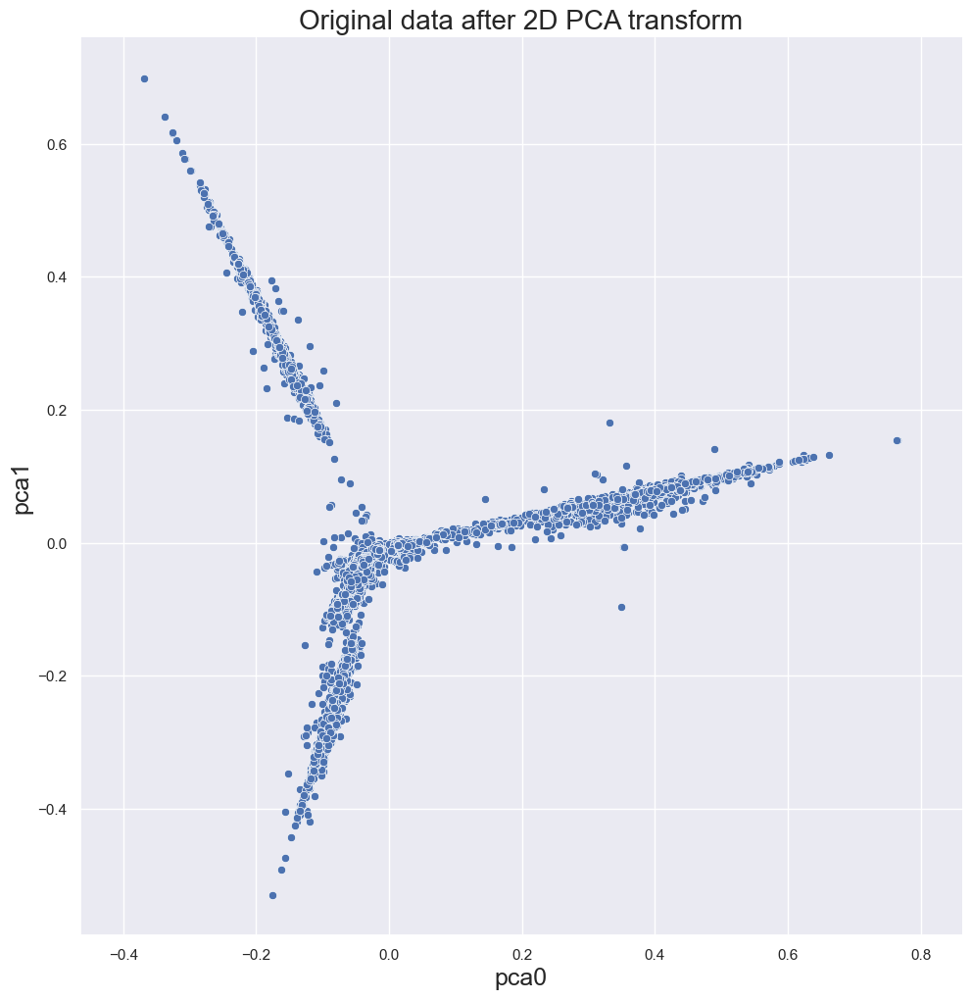

In [77]:
#Aplicamos PCA a sam para reducir dimensiones a 2D
pca2D = PCA(2)
pca2D.fit(samples)
#Transform the data
sample_PCA_2D = pca2D.transform(samples)

df_samples_PCA_2D = pd.DataFrame(data=sample_PCA_2D, columns=["pca0", "pca1"])

title = 'Original data after 2D PCA transform'
axes_PCA_2D = {'x': 'pca0', 'y': 'pca1'}
Plot2D (sample_PCA_2D, title, axes_PCA_2D)

### 1.8.1 Modelación de Vecinos cercanos

In [78]:
from sklearn.neighbors import NearestNeighbors
import numpy as np

def PlotDistancesToKnearestNeighbor(data_vector, K):

  """
  Parameters:
    data_vector (numpy.ndarray): array tipo embedding cuyo
        shape es (n_ejemplo,n_muestras_por_ejemplo)

    k: posición del k-esimo vecino más cercano

  """

  nbrs = NearestNeighbors(n_neighbors=K).fit(data_vector)
  distances, indices = nbrs.kneighbors(data_vector)
  distances = np.sort(distances, axis=0)
  distances = distances[:,K-1]
  plt.figure(figsize=(10,8))
  set_size_letters(f"Distancias al K-vecino más cercano (K={K})",
                   f"Points sorted according to distance of the {K}-th nearest neighbor",
                   f"{K}-th nearest neighbor distance")
  plt.plot(distances)

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



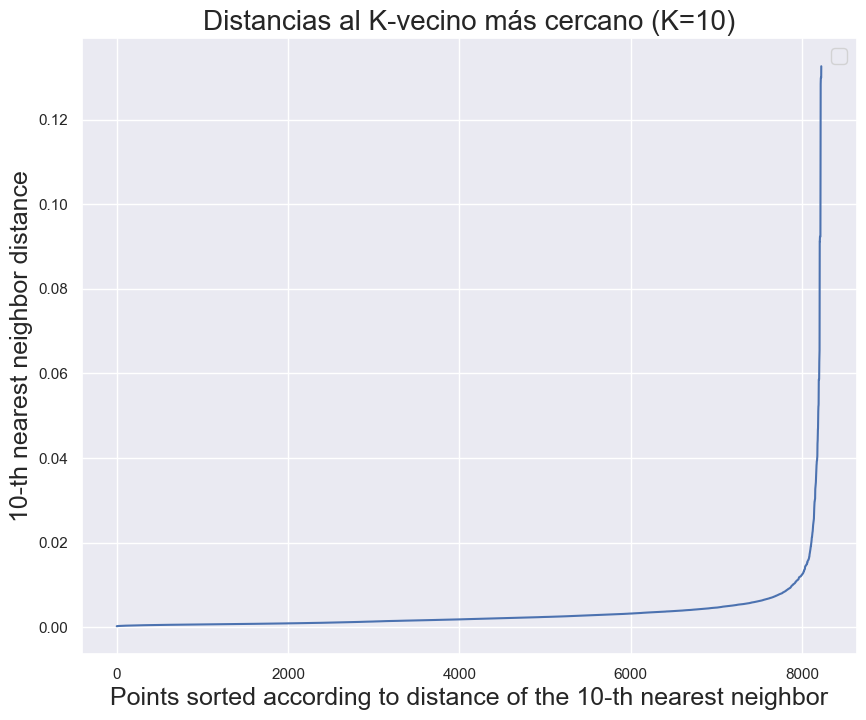

In [79]:
PlotDistancesToKnearestNeighbor(sample_PCA_2D, 10)

### 1.8.2 Aplicamos DBSCAN a los datos

#### 1.8.2.1 Buscamos el epsilon optimo

In [80]:
from sklearn.cluster import DBSCAN

def ApplyDBScanToData (samples, epsilon, min_samples = 30):

  """
  Parameters:

    samples (numpy.ndarray): array tipo embedding cuyo
        shape es (n_ejemplo,n_muestras_por_ejemplo)

    epsilon: int con el valor de epsilon (distancia mínima entre elementos
        para formar un cluster)

    min_samples (int): numero minimo de muestras para generar un cluster

    include_noise (bool): permite seleccionar si se quiere incluir el cluster
        de ruido en el cálculo de la silueta o no. Por defecto no se incluye.
        Se debe incluir cuando únicamente se detecta un cluster, para poder
        realizar la evaluación.

  Return:

    labels: lista con el cluster al que pertenece cada ejemplo de data. Cluster
        -1 significa ruido.
  """


  db = DBSCAN(eps=epsilon, min_samples=min_samples).fit(samples)

  core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
  core_samples_mask[db.core_sample_indices_] = True
  labels = db.labels_

  # Number of clusters in labels, ignoring noise if present.
  n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
  n_noise_ = list(labels).count(-1)

  print(f"\nTest for epsilon = {epsilon}")
  print('Estimated number of clusters: %d' % n_clusters_)
  print('Estimated number of noise points: %d' % n_noise_)
  print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(samples, labels))


  return labels


In [81]:
#Buscamos el Epsilon óptimo para el DBSCAN y aplicamos el algoritmo
min_samples = 10
epsilon_values = [0.007, 0.0075, 0.0076, 0.0077, 0.0078, 0.0079, 0.008, 0.009, 0.021, 0.023, 0.024, 0.025,0.026]
# con user: epsilon_values = [0.020, 0.022, 0.024, 0.026, 0.028, 0.030, 0.032, 0.034, 0.036, 0.038, 0.040]
aux_labels = {}
for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData (sample_PCA_2D, epsilon, min_samples=min_samples)


Test for epsilon = 0.007
Estimated number of clusters: 9
Estimated number of noise points: 358
Silhouette Coefficient: 0.519

Test for epsilon = 0.0075
Estimated number of clusters: 8
Estimated number of noise points: 330
Silhouette Coefficient: 0.539

Test for epsilon = 0.0076
Estimated number of clusters: 8
Estimated number of noise points: 323
Silhouette Coefficient: 0.540

Test for epsilon = 0.0077
Estimated number of clusters: 8
Estimated number of noise points: 313
Silhouette Coefficient: 0.541

Test for epsilon = 0.0078
Estimated number of clusters: 7
Estimated number of noise points: 304
Silhouette Coefficient: 0.602

Test for epsilon = 0.0079
Estimated number of clusters: 5
Estimated number of noise points: 299
Silhouette Coefficient: 0.374

Test for epsilon = 0.008
Estimated number of clusters: 4
Estimated number of noise points: 296
Silhouette Coefficient: 0.410

Test for epsilon = 0.009
Estimated number of clusters: 4
Estimated number of noise points: 239
Silhouette Coeffi

In [82]:
# con user: epsilon = 0.034
epsilon = 0.0078 #602
labels_PCA_2D = aux_labels[epsilon]

# Crear un DataFrame con los tweets y las etiquetas de clúster
tweets_with_labels = pd.DataFrame({
    'tweet': lista_descriptiva,  # Cambia esto por tu columna de tweets procesados
    'label': labels_PCA_2D
})

# Filtrar para ignorar los puntos de ruido
clustered_tweets = tweets_with_labels[tweets_with_labels['label'] != -1]
clustered_tweets

,tweet,label
0,,
0,gran guerra juegodetronos dejado momentos recu...,0
1,golpe venezuela lejos final elif venezuelaenba...,1
2,foto catedral notredame secuencia hermosa,1
3,notredame nunca llegue visitar tan grandiosa c...,1
4,tomar culo crush juegodetronos,0
...,...,...
8218,championsleague gooooooool messi pedazo gol ma...,2
8219,llegaran venezolanos crisis humanitaria puede ...,1
8220,fiesta deberias visitarnos diadellibro diainte...,3


#### 1.8.2.2 Representación del Resultado

In [83]:
def Plot2D_WithLabels (samples_2D, labels, title, axes = {'x': 'x', 'y': 'y'}, palette="bright", centroids_2D=None):

  """
  samples_2D (numpy.ndarray): array tipo embedding cuyo
        shape es (num_muestras, 2) ; 2 por las dos coordenadas

  labels (array): etiqueta perteneciente a cada muestra.

  title(string): titulo de la figura que se utiliza para el plot
  """

  # First we create the dataframe
  df_samples_2D_labeled = pd.DataFrame(data=samples_2D, columns=[axes['x'], axes['y']])

  # Then we add the labels column
  df_samples_2D_labeled['label'] = labels.tolist()

  if centroids_2D is not None:
    labels_centroid_aux = np.arange(len(centroids_2D), dtype=int)
    df_centroids_2D_labeled = pd.DataFrame(data=centroids_2D, columns=[axes['x'], axes['y']])
    df_centroids_2D_labeled['label'] = labels_centroid_aux.tolist()

  sns.set(font_scale=3)
  sns.set(rc={'figure.figsize':(10,10)})
  sns.relplot(data=df_samples_2D_labeled,
              x=axes['x'],
              y=axes['y'],
              hue="label", height=10, legend="full", palette=palette)

  if centroids_2D is not None:
    # First we plot the centroids
    sns.scatterplot(data=df_centroids_2D_labeled,
              x=axes['x'],
              y=axes['y'],
              hue="label",
              legend=False, palette=palette, s=100)

    # Then we plot their labels
    plot_2D_centroid_labels(df_centroids_2D_labeled, plt.gca())

  set_size_letters(title,
                   axes['x'],
                   axes['y'],
                   active_legend = False)
  plt.axis('equal')

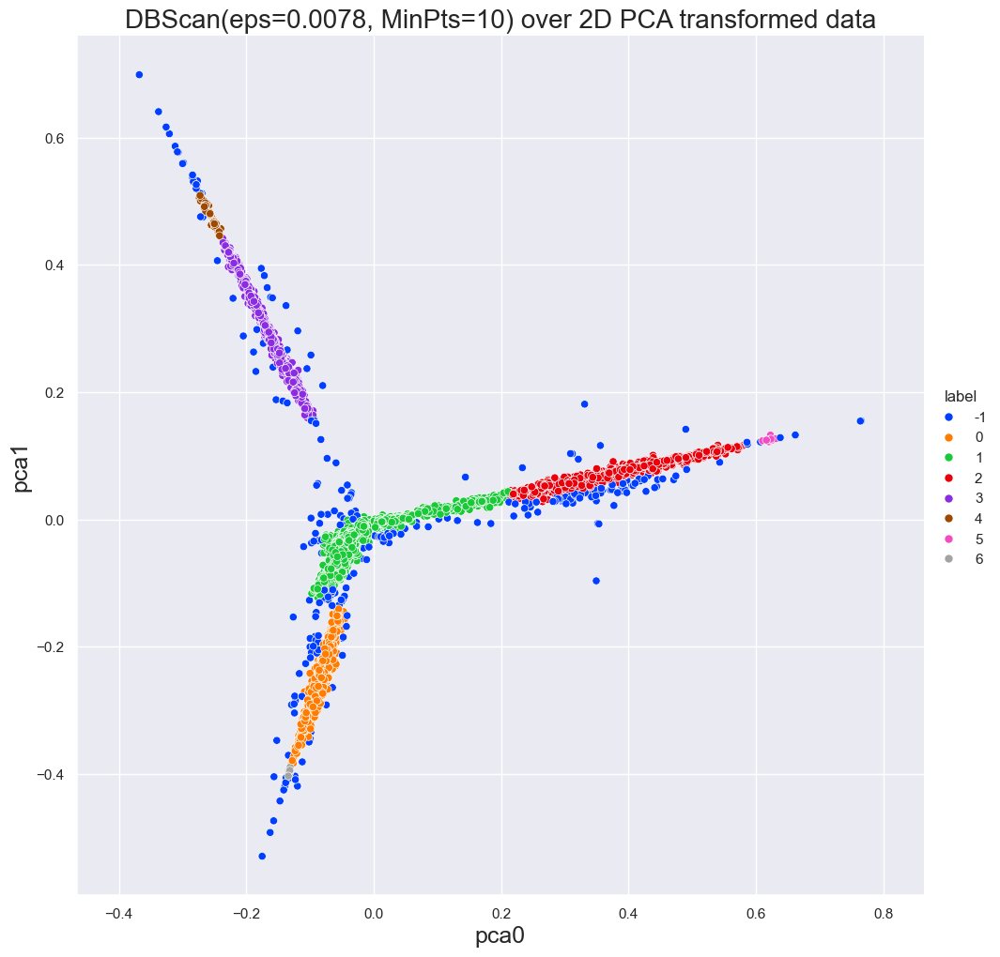

In [84]:
title = f'DBScan(eps={epsilon}, MinPts={min_samples}) over 2D PCA transformed data'
Plot2D_WithLabels (sample_PCA_2D, labels_PCA_2D, title, axes_PCA_2D)

#### 1.8.2.3 Obtener terminos más representativos de c/Cluster para verificar

In [85]:
from collections import Counter

# Función para obtener los términos más representativos por clúster
def get_top_terms_by_cluster(clustered_tweets, top_n=5):
    cluster_topics = {}
    for cluster in clustered_tweets['label'].unique():
        # Filtrar los tweets del clúster actual
        cluster_tweets = clustered_tweets[clustered_tweets['label'] == cluster]['tweet']

        # Tokenizar palabras
        all_words = " ".join(cluster_tweets).split()

        # Contar frecuencia de palabras
        word_counts = Counter(all_words)

        # Obtener las 'top_n' palabras más frecuentes
        cluster_topics[cluster] = word_counts.most_common(top_n)
    return cluster_topics

# Obtener los términos más representativos
top_terms_per_cluster = get_top_terms_by_cluster(clustered_tweets)
top_terms_per_cluster

{0: [('juegodetronos', 1115),
  ('gameofthrones', 352),
  ('capitulo', 300),
  ('got', 162),
  ('ver', 141)],
 1: [('elecccionesgeneralesa', 1123),
  ('venezuela', 1114),
  ('notredame', 1113),
  ('gretathunberg', 606),
  ('laliga', 515)],
 2: [('championsleague', 1050),
  ('messi', 398),
  ('liverpool', 222),
  ('barcelona', 218),
  ('futbol', 109)],
 3: [('diadellibro', 1008),
  ('libro', 333),
  ('libros', 226),
  ('leer', 133),
  ('feliz', 130)],
 4: [('diadellibro', 100),
  ('libro', 38),
  ('feliz', 24),
  ('libros', 19),
  ('leer', 9)],
 5: [('championsleague', 16),
  ('messi', 15),
  ('barcelona', 3),
  ('liverpool', 3),
  ('campnou', 2)],
 6: [('juegodetronos', 11),
  ('capitulo', 5),
  ('historia', 2),
  ('gameofthrones', 2),
  ('resumen', 1)]}

### 1.8.3 Aplicamos K-Means a los datos

#### 1.8.3.1 Buscamos la cantidad de clusters optima y aplicamos KMEANS

In [86]:
#calculo kmeans del texto con aplicar PCA
clusters =[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
silhouette_avg = []


for i in clusters:
    km = KMeans(n_clusters=i, init='random', max_iter=200, random_state=0).fit(sample_PCA_2D)
    sample_km_pca_2d = km.labels_
    
    score = silhouette_score(sample_PCA_2D, km.labels_)
    silhouette_avg.append(score)
    
    print("cantidad de cluster:", i)
    print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(sample_PCA_2D, sample_km_pca_2d))

#3 clusters - 0.722

cantidad de cluster: 2
Silhouette Coefficient: 0.622
cantidad de cluster: 3
Silhouette Coefficient: 0.740
cantidad de cluster: 4
Silhouette Coefficient: 0.742
cantidad de cluster: 5
Silhouette Coefficient: 0.721
cantidad de cluster: 6
Silhouette Coefficient: 0.640
cantidad de cluster: 7
Silhouette Coefficient: 0.540
cantidad de cluster: 8
Silhouette Coefficient: 0.476
cantidad de cluster: 9
Silhouette Coefficient: 0.509
cantidad de cluster: 10
Silhouette Coefficient: 0.503
cantidad de cluster: 11
Silhouette Coefficient: 0.530
cantidad de cluster: 12
Silhouette Coefficient: 0.502
cantidad de cluster: 13
Silhouette Coefficient: 0.499
cantidad de cluster: 14
Silhouette Coefficient: 0.531
cantidad de cluster: 15
Silhouette Coefficient: 0.529
cantidad de cluster: 16
Silhouette Coefficient: 0.489
cantidad de cluster: 17
Silhouette Coefficient: 0.499
cantidad de cluster: 18
Silhouette Coefficient: 0.499
cantidad de cluster: 19
Silhouette Coefficient: 0.491
cantidad de cluster: 20
Silhouette C

#### 1.8.3.2 Grafico KMEANS

In [87]:
n_clusters = clusters[pd.Series(silhouette_avg).idxmax()]
kmeans = KMeans(n_clusters=n_clusters)
label = kmeans.fit_predict(sample_PCA_2D)


# Crear un DataFrame con los tweets y las etiquetas de clúster
tweets_with_labels = pd.DataFrame({
    'tweet': lista_descriptiva,  # Cambia esto por tu columna de tweets procesados
    'label': label
})

# Filtrar para ignorar los puntos de ruido
clustered_tweets = tweets_with_labels[tweets_with_labels['label'] != -1]
clustered_tweets

,tweet,label
0,,
0,gran guerra juegodetronos dejado momentos recu...,3
1,golpe venezuela lejos final elif venezuelaenba...,1
2,foto catedral notredame secuencia hermosa,1
3,notredame nunca llegue visitar tan grandiosa c...,1
4,tomar culo crush juegodetronos,3
...,...,...
8218,championsleague gooooooool messi pedazo gol ma...,0
8219,llegaran venezolanos crisis humanitaria puede ...,1
8220,fiesta deberias visitarnos diadellibro diainte...,2


In [88]:
def plot_2D_centroid_labels(df_centroids, ax):
    for index, row in df_centroids.iterrows():
        ax.text(row[0], row[1], 'C'+str(row[2].astype(int)), 
                fontsize=20, color='black', weight='semibold')

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\136881814.py:3: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



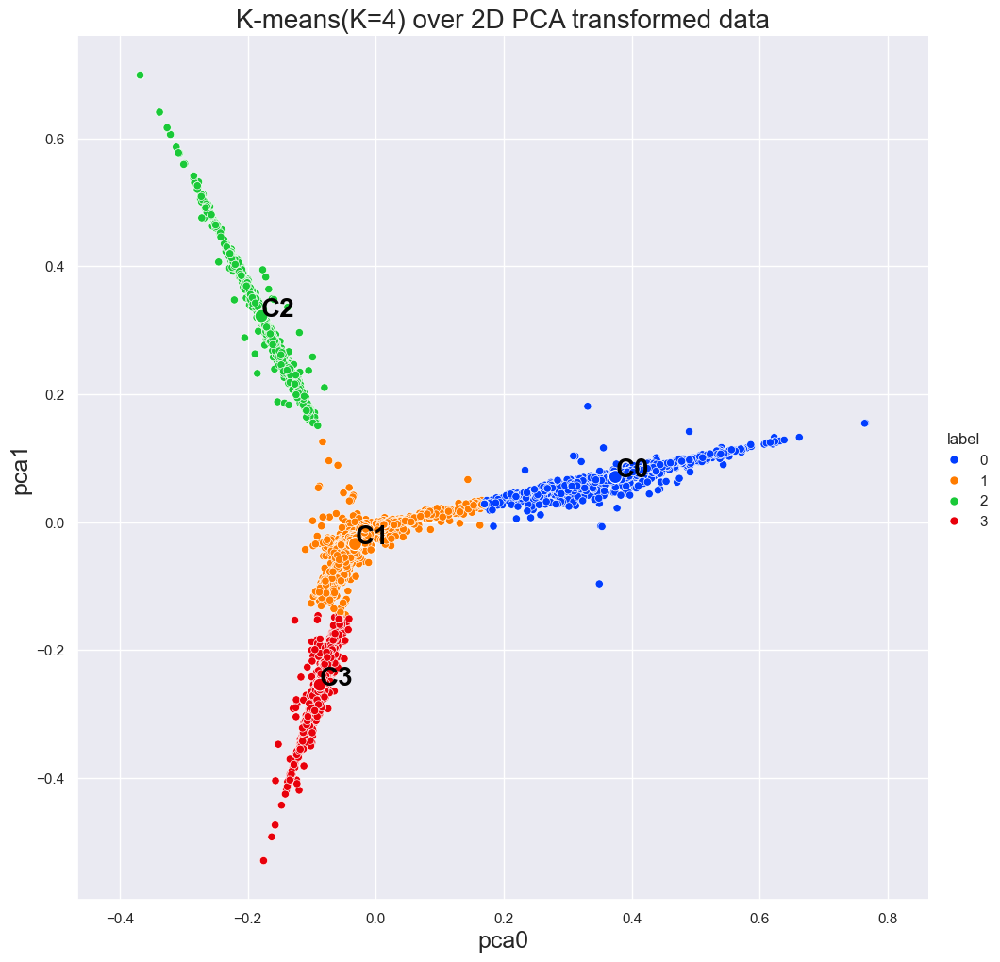

In [89]:
axes_PCA = {'x': 'pca0', 'y': 'pca1'}
title = f'K-means(K={n_clusters}) over 2D PCA transformed data'
plot = Plot2D_WithLabels(sample_PCA_2D, label, title, axes_PCA , centroids_2D=kmeans.cluster_centers_)

#### 1.8.3.3 Obtener terminos más representativos de c/Cluster para verificar

In [90]:
from collections import Counter

# Función para obtener los términos más representativos por clúster
def get_top_terms_by_cluster(clustered_tweets, top_n=5):
    cluster_topics = {}
    for cluster in clustered_tweets['label'].unique():
        # Filtrar los tweets del clúster actual
        cluster_tweets = clustered_tweets[clustered_tweets['label'] == cluster]['tweet']

        # Tokenizar palabras
        all_words = " ".join(cluster_tweets).split()

        # Contar frecuencia de palabras
        word_counts = Counter(all_words)

        # Obtener las 'top_n' palabras más frecuentes
        cluster_topics[cluster] = word_counts.most_common(top_n)
    return cluster_topics

# Obtener los términos más representativos
top_terms_per_cluster = get_top_terms_by_cluster(clustered_tweets)
top_terms_per_cluster

{3: [('juegodetronos', 1180),
  ('gameofthrones', 372),
  ('capitulo', 322),
  ('got', 166),
  ('ver', 153)],
 1: [('elecccionesgeneralesa', 1144),
  ('notredame', 1122),
  ('venezuela', 1119),
  ('gretathunberg', 612),
  ('laliga', 508)],
 0: [('championsleague', 1177),
  ('messi', 474),
  ('barcelona', 253),
  ('liverpool', 235),
  ('futbol', 123)],
 2: [('diadellibro', 1180),
  ('libro', 397),
  ('libros', 256),
  ('feliz', 163),
  ('leer', 146)]}

## 1.9 Reducción por t-SNE 2D

### 1.9.1 Creación del modelo

In [92]:
tsne2D = TSNE(n_components=2)
samples_TSNE_2D = tsne2D.fit_transform(samples)
df_samples_TSNE_2D = pd.DataFrame(data=samples_TSNE_2D, columns=["tsne0", "tsne1"])

### 1.9.2 Representación Visual del Modelo

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:18: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



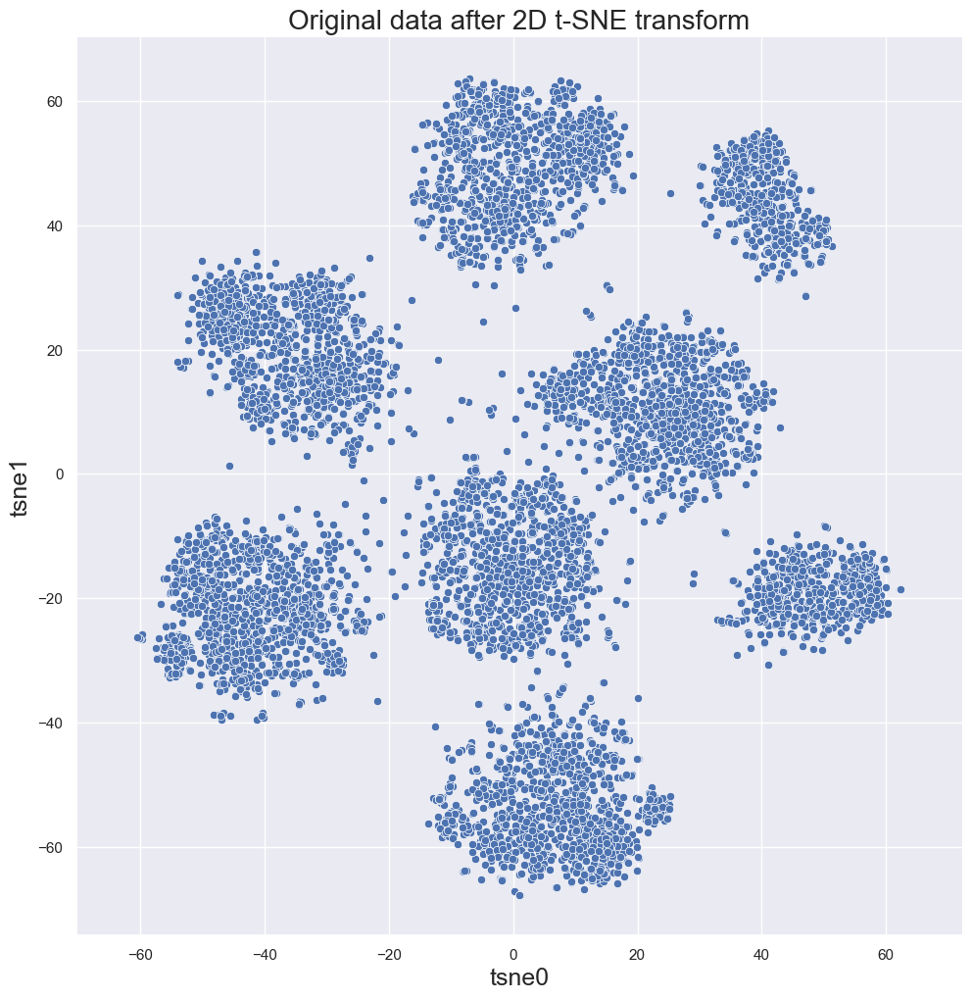

In [93]:
title = 'Original data after 2D t-SNE transform'
axes_TSNE_2D = {'x': 'tsne0', 'y': 'tsne1'}
Plot2D (samples_TSNE_2D, title, axes_TSNE_2D)

### 1.9.3 Aplicamos K-Means t-SNE 2D a los datos

#### 1.9.3.1 Buscamos la cantidad de clusters optima y aplicamos KMEANS

In [110]:
#calculo kmeans del texto con aplicar PCA
clusters =[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
silhouette_avg = []


for i in clusters:
    km = KMeans(n_clusters=i, init='random', max_iter=200, random_state=0).fit(samples_TSNE_2D)
    sample_km_pca_2d = km.labels_
    
    score = silhouette_score(samples_TSNE_2D, km.labels_)
    silhouette_avg.append(score)
    
    print("cantidad de cluster:", i)
    print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(samples_TSNE_2D, sample_km_pca_2d))

cantidad de cluster: 2
Silhouette Coefficient: 0.383
cantidad de cluster: 3
Silhouette Coefficient: 0.441
cantidad de cluster: 4
Silhouette Coefficient: 0.448
cantidad de cluster: 5
Silhouette Coefficient: 0.478
cantidad de cluster: 6
Silhouette Coefficient: 0.523
cantidad de cluster: 7
Silhouette Coefficient: 0.570
cantidad de cluster: 8
Silhouette Coefficient: 0.615
cantidad de cluster: 9
Silhouette Coefficient: 0.577
cantidad de cluster: 10
Silhouette Coefficient: 0.539
cantidad de cluster: 11
Silhouette Coefficient: 0.506
cantidad de cluster: 12
Silhouette Coefficient: 0.471
cantidad de cluster: 13
Silhouette Coefficient: 0.481
cantidad de cluster: 14
Silhouette Coefficient: 0.455
cantidad de cluster: 15
Silhouette Coefficient: 0.455
cantidad de cluster: 16
Silhouette Coefficient: 0.435
cantidad de cluster: 17
Silhouette Coefficient: 0.416
cantidad de cluster: 18
Silhouette Coefficient: 0.436
cantidad de cluster: 19
Silhouette Coefficient: 0.408
cantidad de cluster: 20
Silhouette C

#### 1.9.3.2 Graficamos KMeans

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\136881814.py:3: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



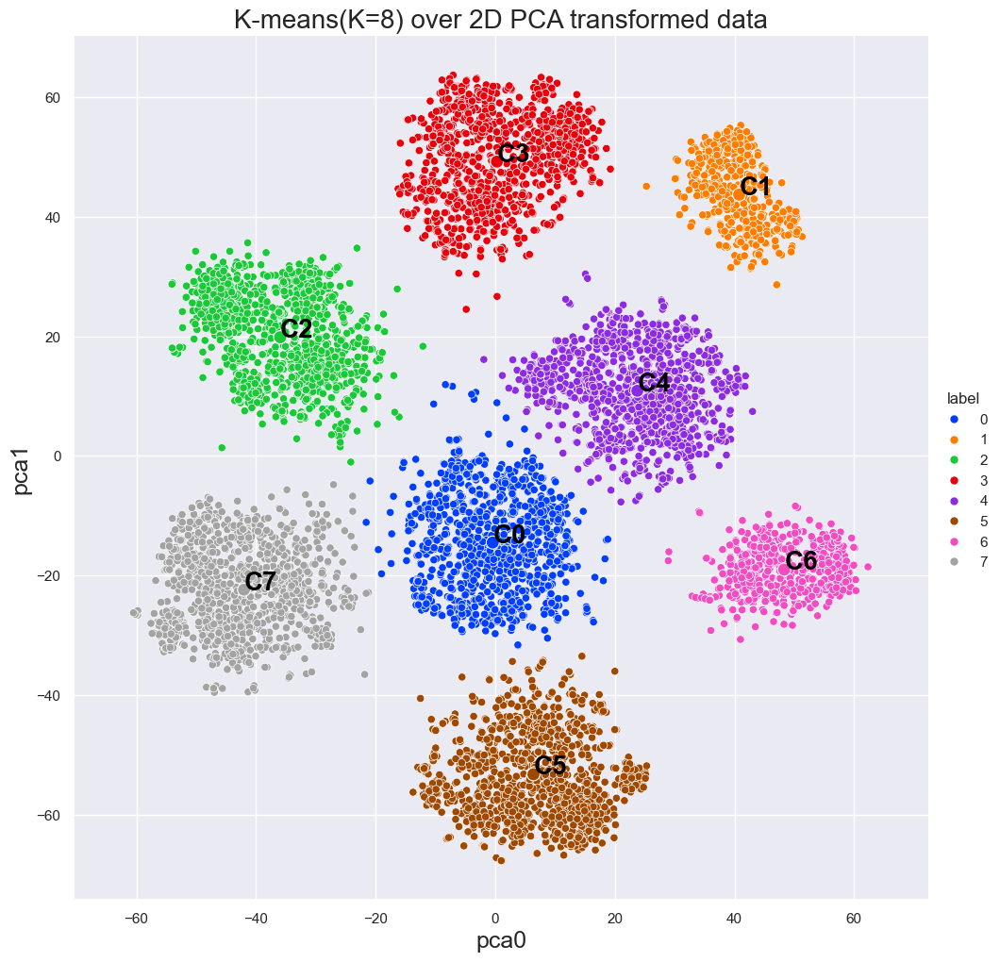

In [111]:
n_clusters = clusters[pd.Series(silhouette_avg).idxmax()]
kmeans = KMeans(n_clusters=n_clusters)
label = kmeans.fit_predict(samples_TSNE_2D)

axes_PCA = {'x': 'pca0', 'y': 'pca1'}
title = f'K-means(K={n_clusters}) over 2D PCA transformed data'
plot = Plot2D_WithLabels(samples_TSNE_2D, kmeans.labels_, title, axes_PCA, centroids_2D=kmeans.cluster_centers_)

### 1.9.4 Modelación KnearestNeighbor TSNE 2D

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



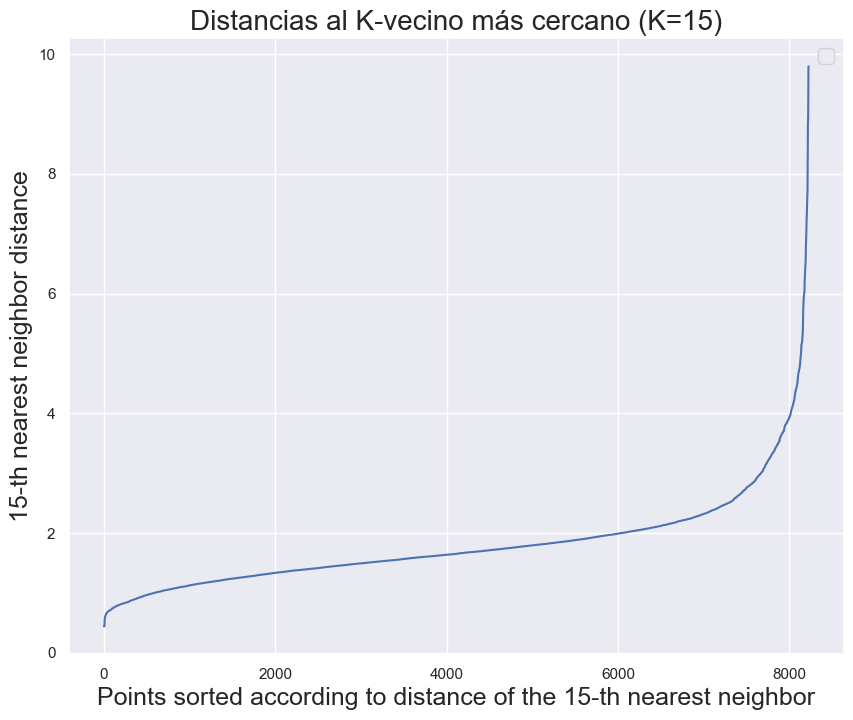

In [96]:
PlotDistancesToKnearestNeighbor(samples_TSNE_2D, 15)

### 1.9.5 Aplicar DBScan

#### 1.9.5.1 Encontrar Epsilon óptimo

In [107]:
min_samples = 20
epsilon_values = [3, 3.2, 3.4, 3.6, 3.8, 3.9, 4, 4.05, 4.055,4.1, 4.3, 4.5, 4.7, 4.9, 5.0, 5.1]
aux_labels = {}

for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData (samples_TSNE_2D, epsilon, min_samples=min_samples)


Test for epsilon = 3
Estimated number of clusters: 8
Estimated number of noise points: 244
Silhouette Coefficient: 0.593

Test for epsilon = 3.2
Estimated number of clusters: 8
Estimated number of noise points: 207
Silhouette Coefficient: 0.597

Test for epsilon = 3.4
Estimated number of clusters: 8
Estimated number of noise points: 167
Silhouette Coefficient: 0.601

Test for epsilon = 3.6
Estimated number of clusters: 8
Estimated number of noise points: 136
Silhouette Coefficient: 0.604

Test for epsilon = 3.8
Estimated number of clusters: 8
Estimated number of noise points: 101
Silhouette Coefficient: 0.607

Test for epsilon = 3.9
Estimated number of clusters: 8
Estimated number of noise points: 83
Silhouette Coefficient: 0.609

Test for epsilon = 4
Estimated number of clusters: 8
Estimated number of noise points: 70
Silhouette Coefficient: 0.609

Test for epsilon = 4.05
Estimated number of clusters: 8
Estimated number of noise points: 68
Silhouette Coefficient: 0.610

Test for epsi

In [108]:
#epsilon = 3.4
epsilon = 4.3
labels_TSNE_2D = aux_labels[epsilon]

#### 1.9.5.2 Representación grafica del resultado

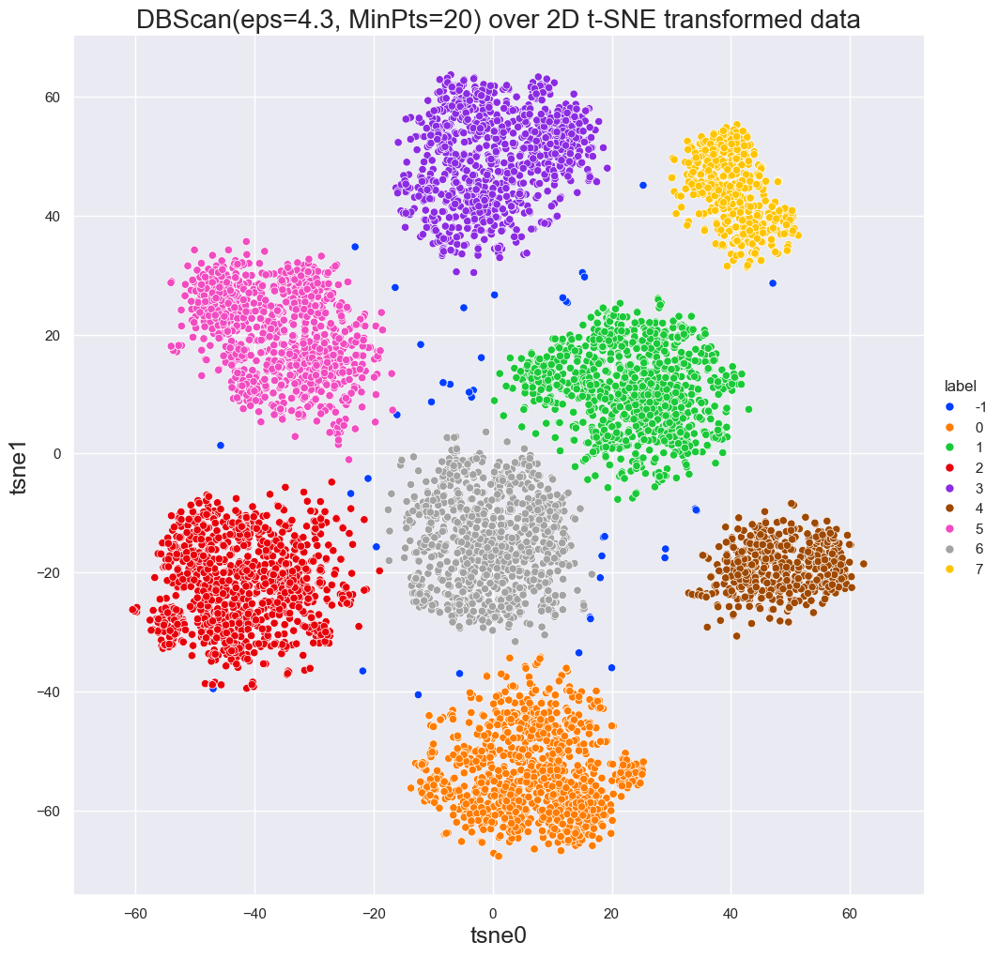

In [109]:
title = f'DBScan(eps={epsilon}, MinPts={min_samples}) over 2D t-SNE transformed data'
Plot2D_WithLabels (samples_TSNE_2D, labels_TSNE_2D, title, axes_TSNE_2D)

# 2. Embeding BETO

## 2.1 Carga de Datos

In [112]:
embeddings_beto = np.load("EmoEvalEs-embeddings-BETO.npy")



## 2.2 Sin reducción de dimensionalidad

### 2.2.1 Nearest Neighbor

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



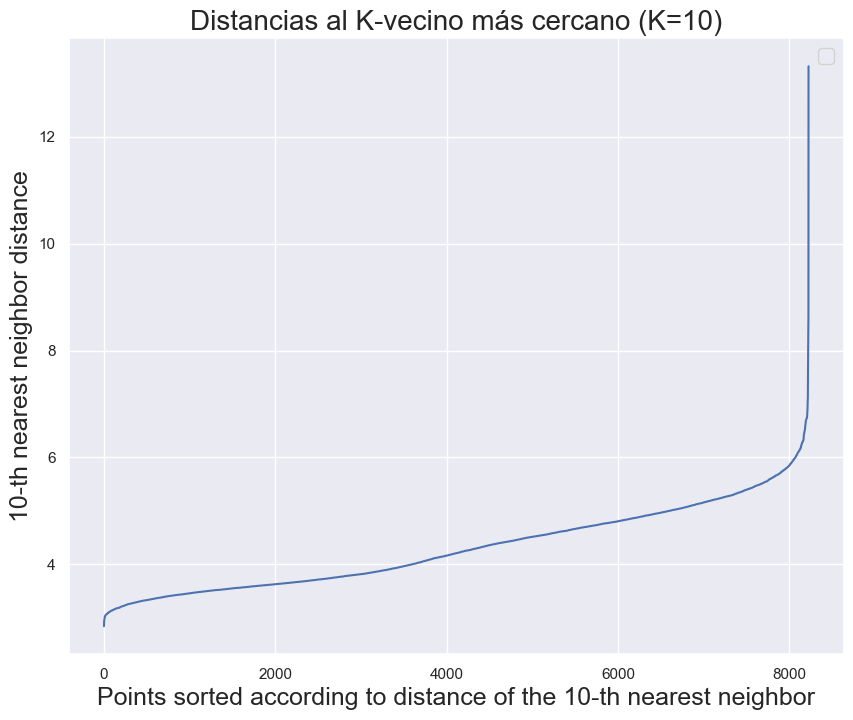

In [113]:
PlotDistancesToKnearestNeighbor(embeddings_beto, 10)

### 2.2.2 DBScan sin Reducción de Dimensionalidad

In [114]:
min_samples = 10
epsilon_values = [4,4.1,4.2,4.3,4.4,4.5,4.6,4.7,4.8,5,6]
aux_labels = {}
for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData(embeddings_beto, epsilon, min_samples=min_samples)


Test for epsilon = 4
Estimated number of clusters: 3
Estimated number of noise points: 4069
Silhouette Coefficient: 0.047

Test for epsilon = 4.1
Estimated number of clusters: 3
Estimated number of noise points: 3718
Silhouette Coefficient: 0.040

Test for epsilon = 4.2
Estimated number of clusters: 1
Estimated number of noise points: 3377
Silhouette Coefficient: 0.121

Test for epsilon = 4.3
Estimated number of clusters: 2
Estimated number of noise points: 2995
Silhouette Coefficient: 0.092

Test for epsilon = 4.4
Estimated number of clusters: 2
Estimated number of noise points: 2618
Silhouette Coefficient: 0.049

Test for epsilon = 4.5
Estimated number of clusters: 1
Estimated number of noise points: 2234
Silhouette Coefficient: 0.119

Test for epsilon = 4.6
Estimated number of clusters: 1
Estimated number of noise points: 1881
Silhouette Coefficient: 0.122

Test for epsilon = 4.7
Estimated number of clusters: 1
Estimated number of noise points: 1584
Silhouette Coefficient: 0.127

T

In [115]:
epsilon = 6
labels = aux_labels[epsilon]

### 2.2.3 K-Means sin PCA

In [118]:
for i in range(2,20):
    km = KMeans(n_clusters=i, init='random', max_iter=200, random_state=0).fit(embeddings_beto)
    sample_km = km.labels_
    score = metrics.silhouette_score(embeddings_beto, sample_km)
    print("cantidad de cluster:", i)
    print("Silhouette Coefficient: %0.3f" % score)

cantidad de cluster: 2
Silhouette Coefficient: 0.148
cantidad de cluster: 3
Silhouette Coefficient: 0.152
cantidad de cluster: 4
Silhouette Coefficient: 0.141
cantidad de cluster: 5
Silhouette Coefficient: 0.050
cantidad de cluster: 6
Silhouette Coefficient: 0.055
cantidad de cluster: 7
Silhouette Coefficient: 0.054
cantidad de cluster: 8
Silhouette Coefficient: 0.057
cantidad de cluster: 9
Silhouette Coefficient: 0.059
cantidad de cluster: 10
Silhouette Coefficient: 0.041
cantidad de cluster: 11
Silhouette Coefficient: 0.053
cantidad de cluster: 12
Silhouette Coefficient: 0.046
cantidad de cluster: 13
Silhouette Coefficient: 0.046
cantidad de cluster: 14
Silhouette Coefficient: 0.046
cantidad de cluster: 15
Silhouette Coefficient: 0.048
cantidad de cluster: 16
Silhouette Coefficient: 0.038
cantidad de cluster: 17
Silhouette Coefficient: 0.038
cantidad de cluster: 18
Silhouette Coefficient: 0.040
cantidad de cluster: 19
Silhouette Coefficient: 0.041


## 2.3 Con reducción de dimensionalidad

### 2.3.1 K-Means PCA 2D

#### 2.3.1.1 Búsqueda N° óptimo CLusters

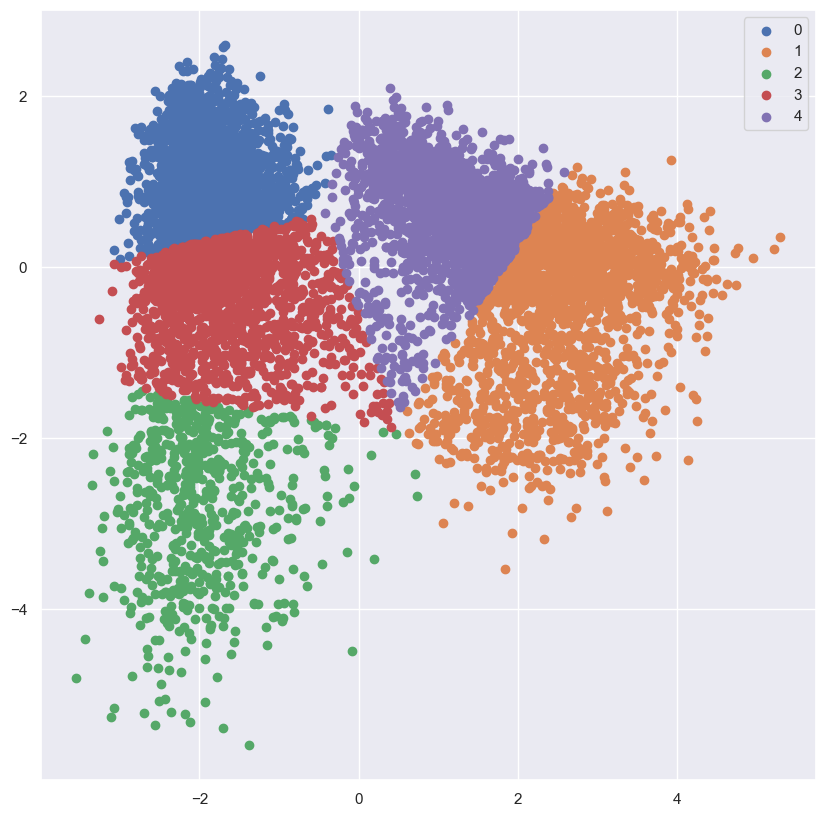

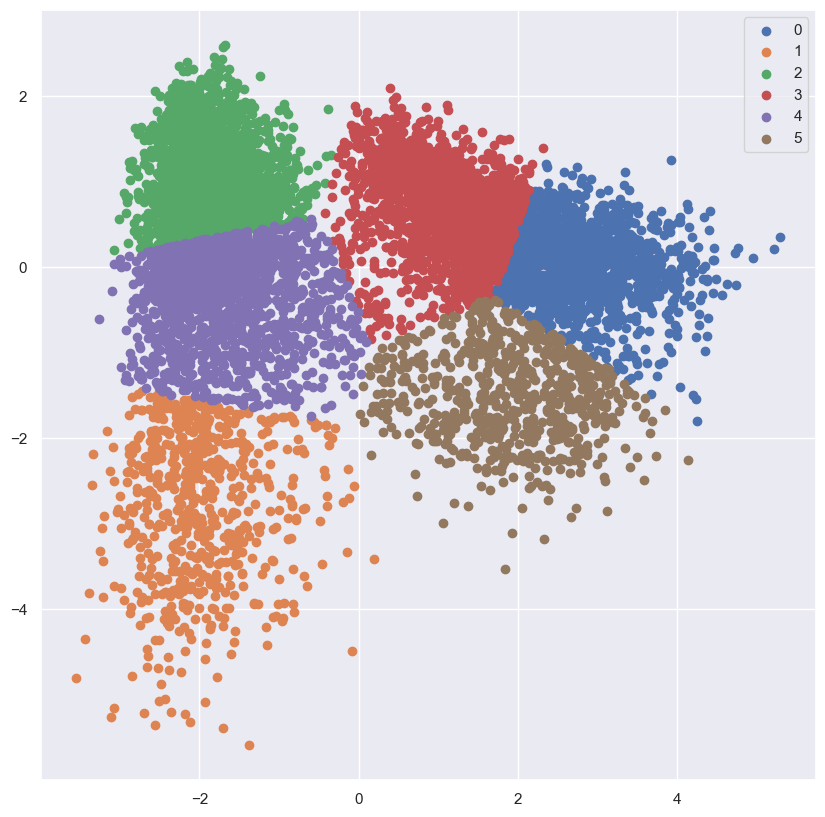

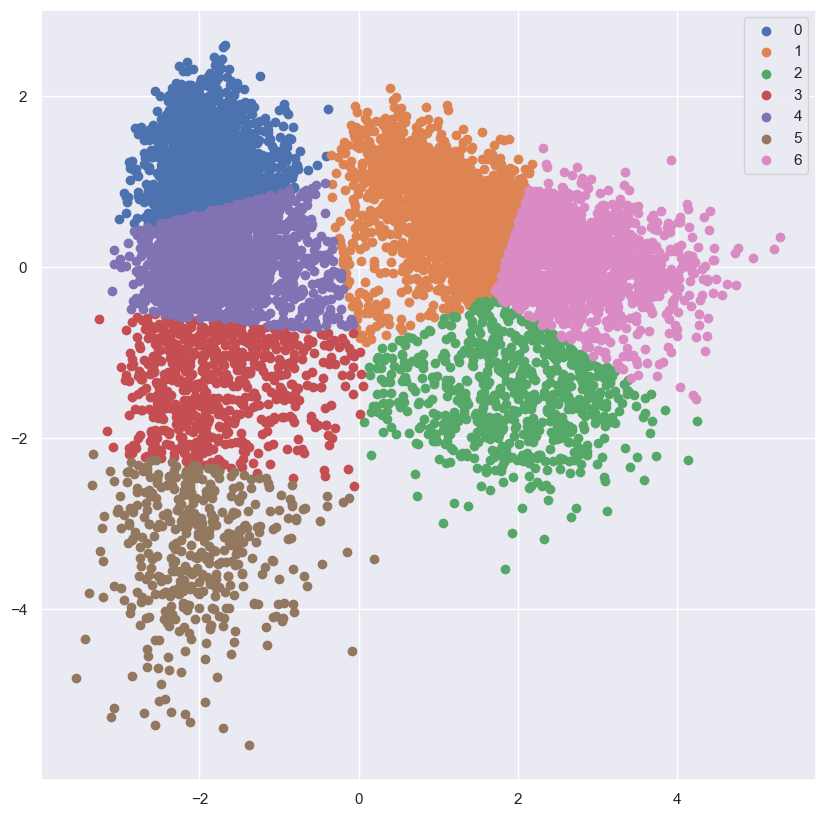

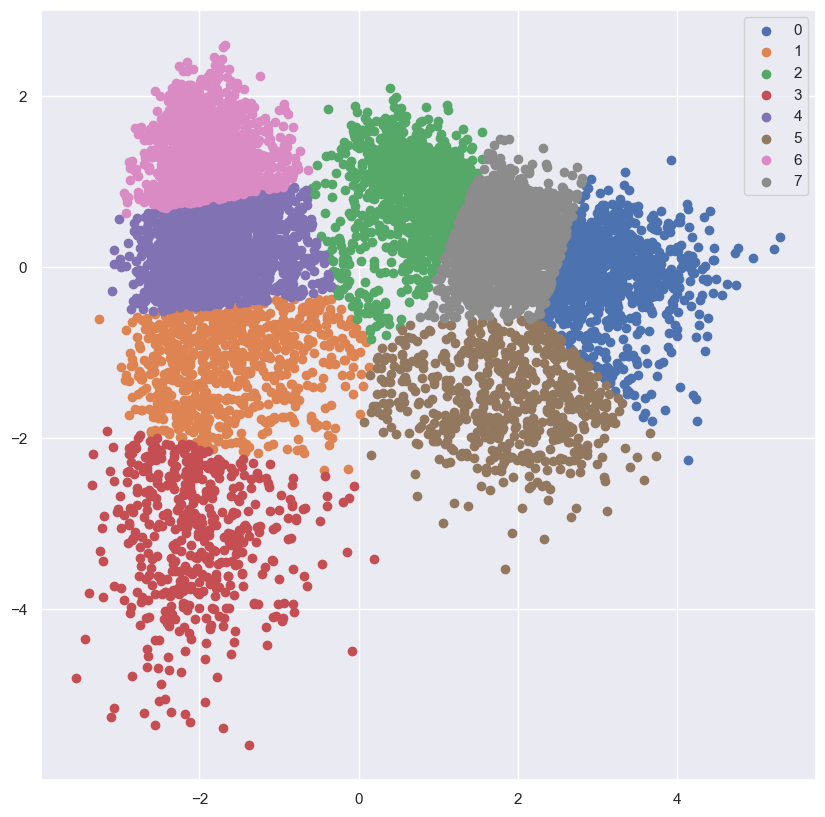

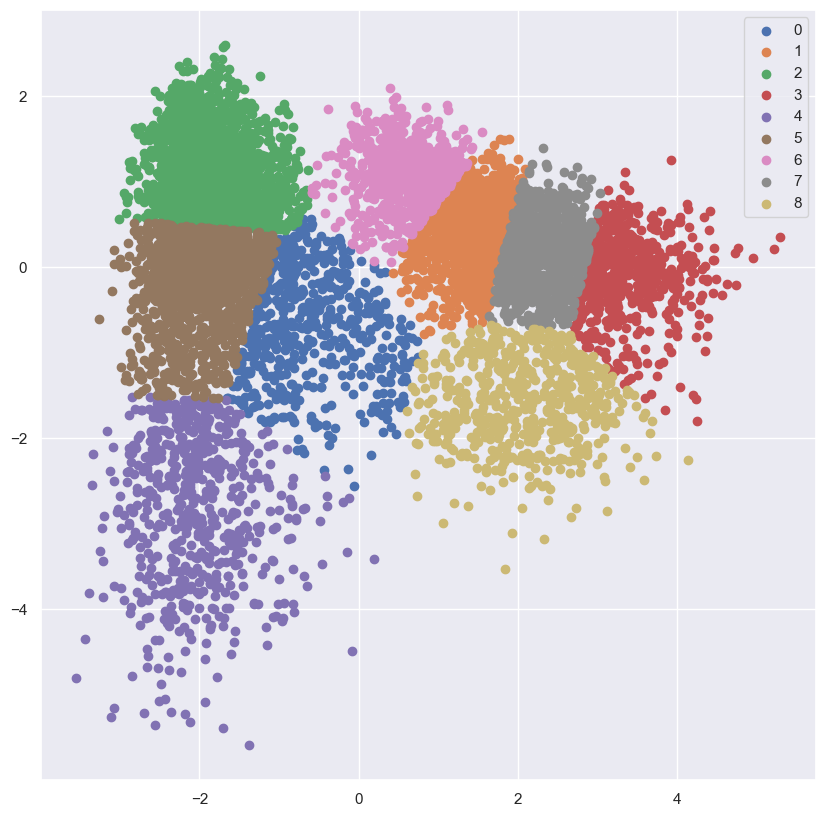

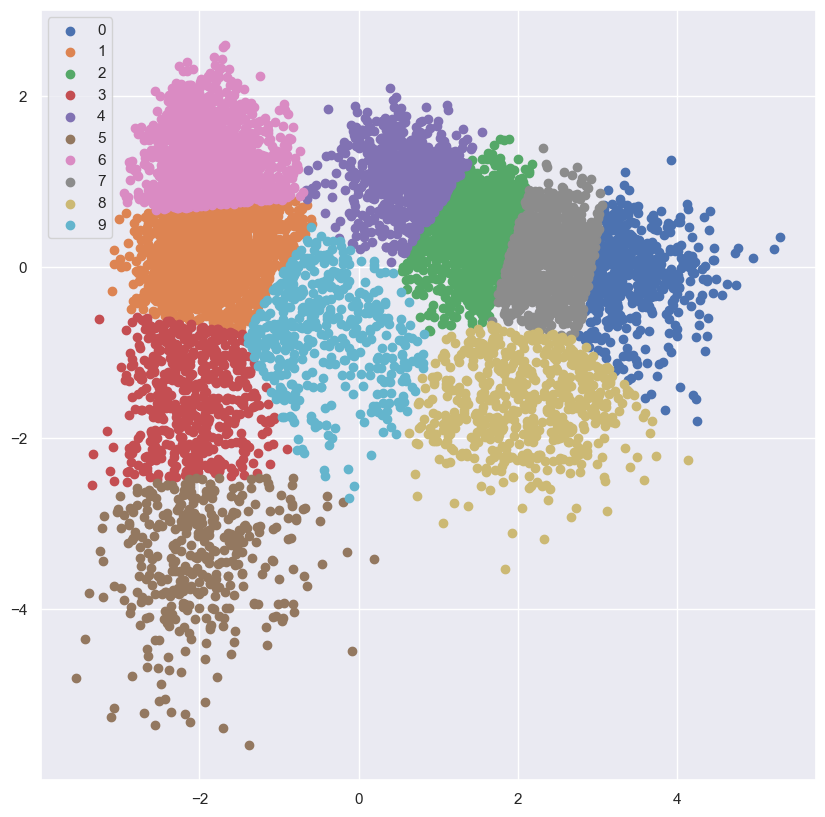

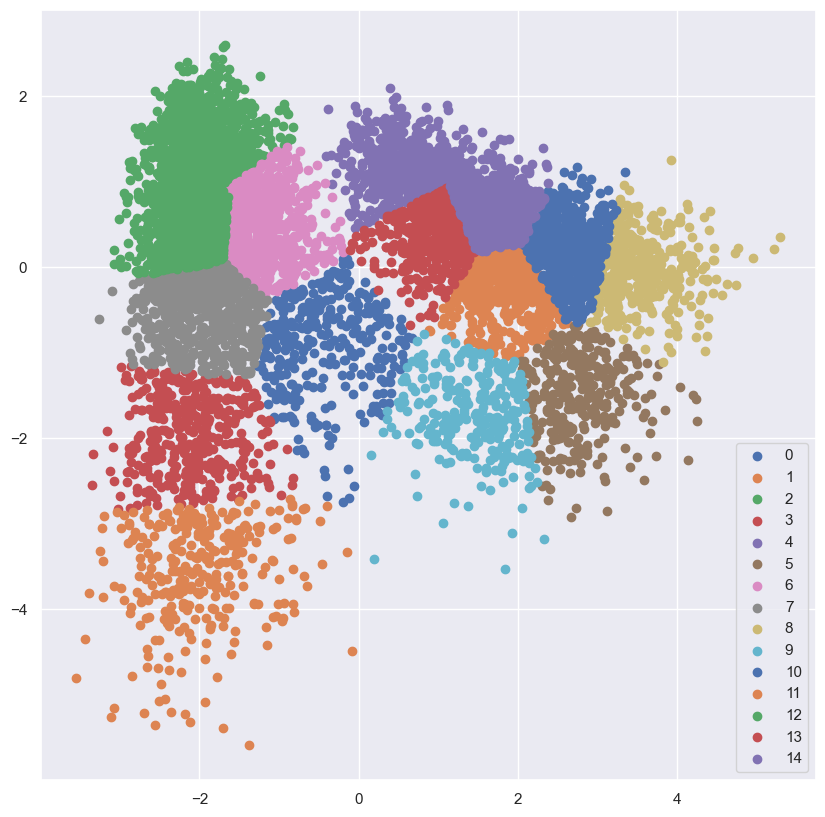

In [120]:
# Raw Data
pca2D = PCA(2)
 
#Transform the data
df_2D = pca2D.fit_transform(embeddings_beto)

df_samples_PCA_2D = pd.DataFrame(data=df_2D, columns=["pca0", "pca1"])

clusters = [5,6,7,8,9,10,15]
silhouette_avg = []

for i in clusters:
    #Initialize the class object
    kmeans = KMeans(n_clusters=i)
     
    #predict the labels of clusters.
    label = kmeans.fit_predict(df_samples_PCA_2D)
     
    #Getting unique labels
    u_labels = np.unique(label)
     
    #plotting the results:
    for i in u_labels:
        plt.scatter(df_2D[label == i , 0] , df_2D[label == i , 1] , label = i)
    plt.legend()
    plt.show()
    
    score = silhouette_score(df_samples_PCA_2D, kmeans.labels_)
    silhouette_avg.append(score)

#### 2.3.1.2 Modelacion N° clusters - Score Silhouette

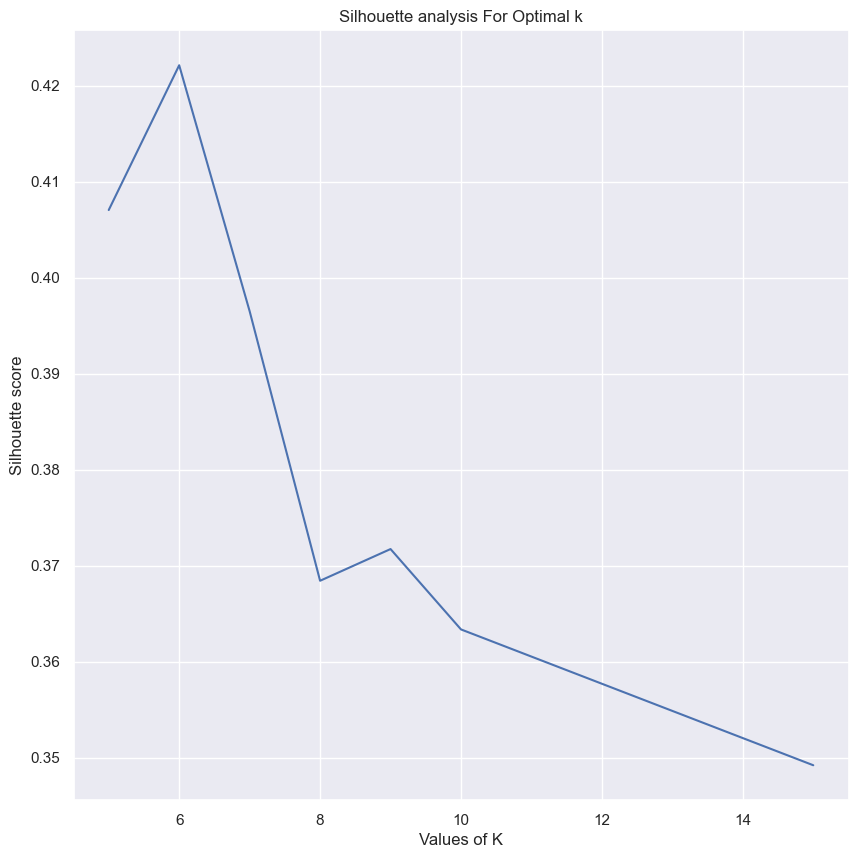

N° Clusters con mejor Score:  6 
Score:  0.42213598


In [121]:
plt.plot(clusters,silhouette_avg)
plt.xlabel("Values of K") 
plt.ylabel("Silhouette score") 
plt.title("Silhouette analysis For Optimal k")
plt.show()
print("N° Clusters con mejor Score: ",clusters[pd.Series(silhouette_avg).idxmax()],"\nScore: ",max(silhouette_avg))

#### 2.3.1.3 Modelado K-Means con N° Óptimo Clusters 2D

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\136881814.py:3: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



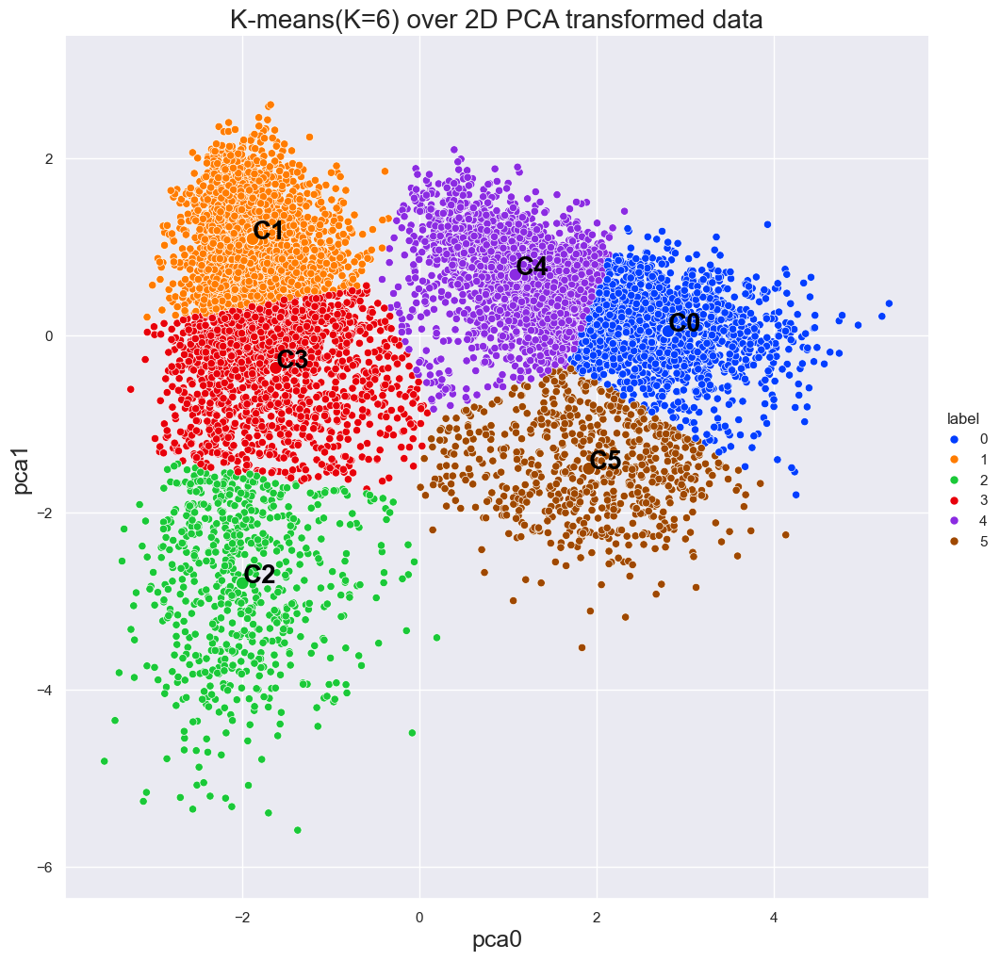

In [122]:
n_clusters = clusters[pd.Series(silhouette_avg).idxmax()]
kmeans = KMeans(n_clusters=n_clusters)
label = kmeans.fit_predict(df_samples_PCA_2D)

axes_PCA = {'x': 'pca0', 'y': 'pca1'}
title = f'K-means(K={n_clusters}) over 2D PCA transformed data'
plot = Plot2D_WithLabels(df_samples_PCA_2D, kmeans.labels_, title, axes_PCA, centroids_2D=kmeans.cluster_centers_)

### 2.3.2 K-Means PCA 3D

#### 2.3.2.1 Búsqueda N° óptimo Clusters

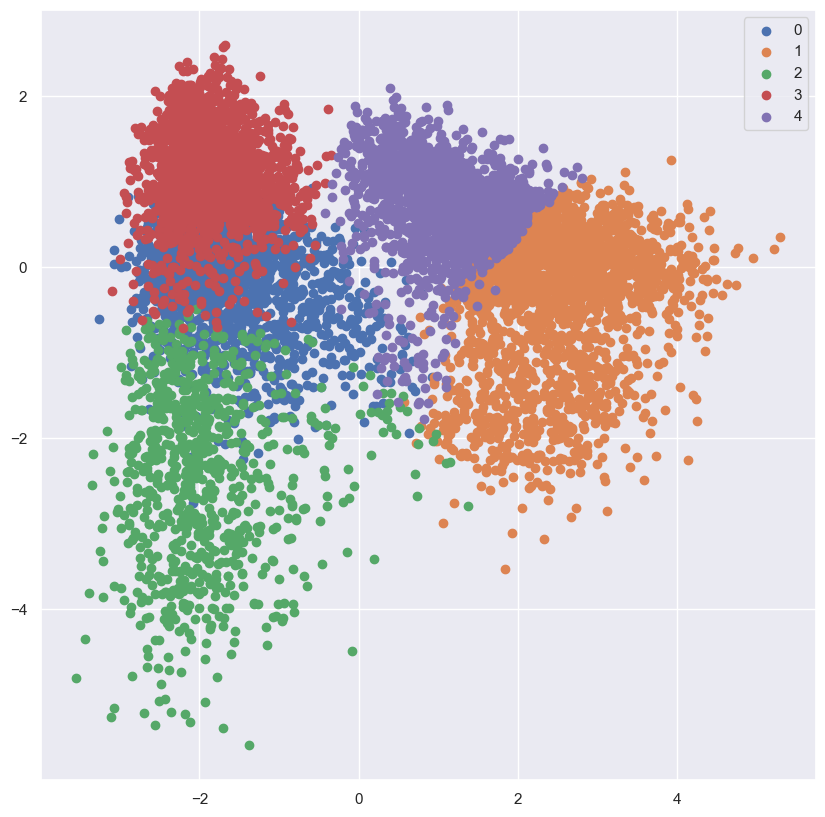

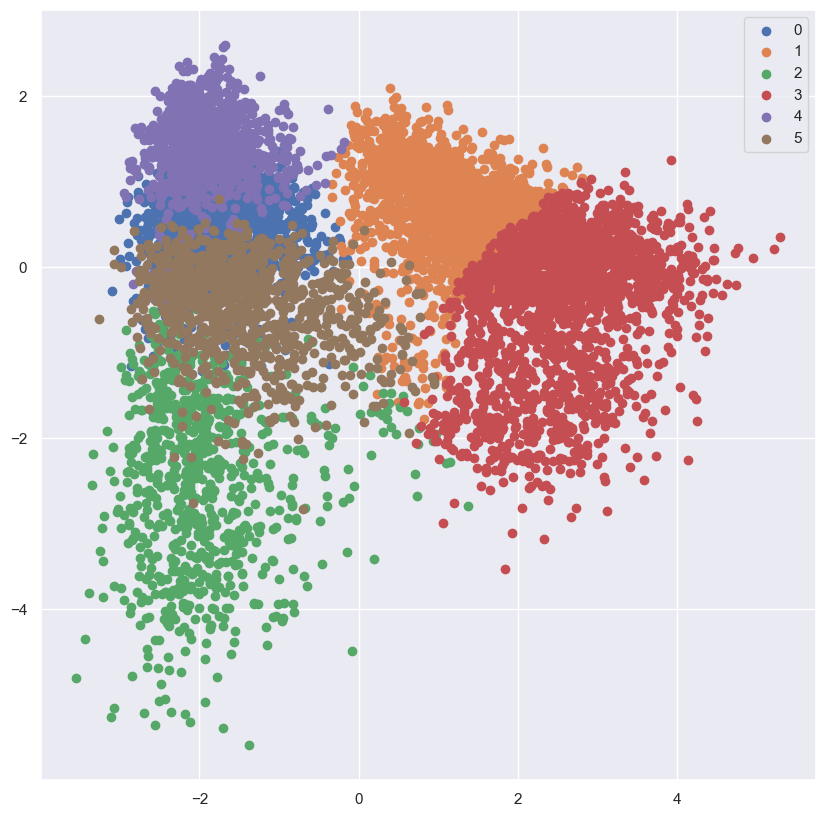

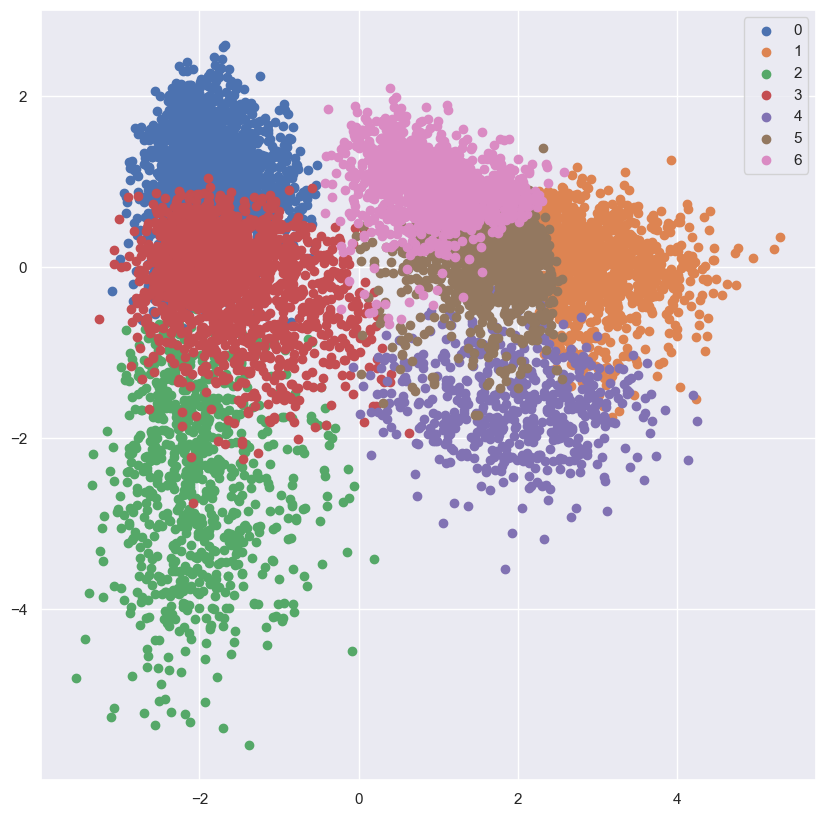

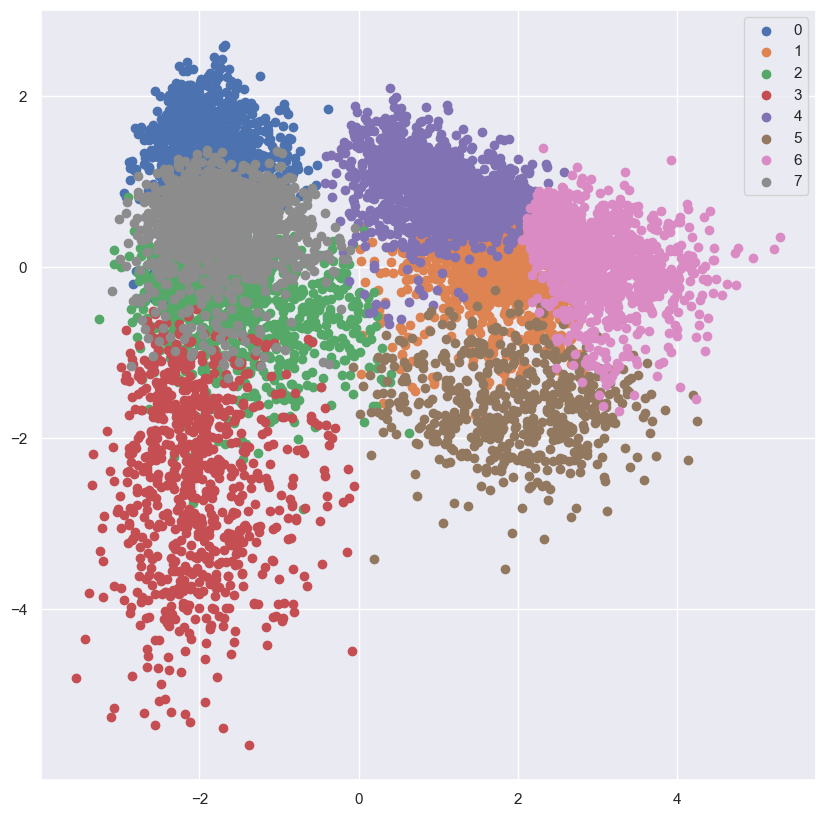

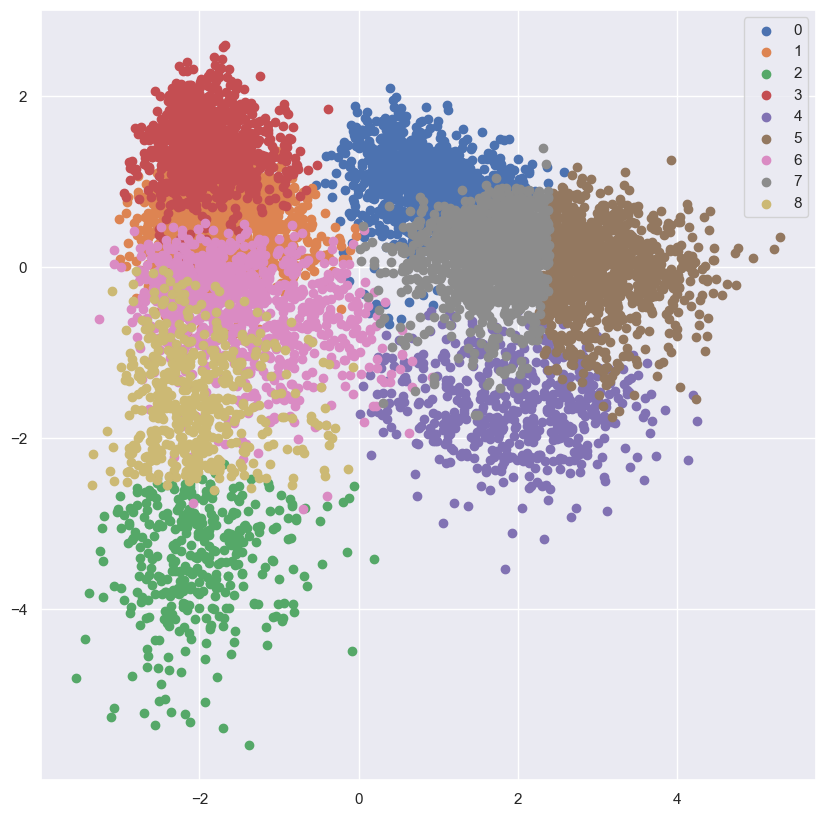

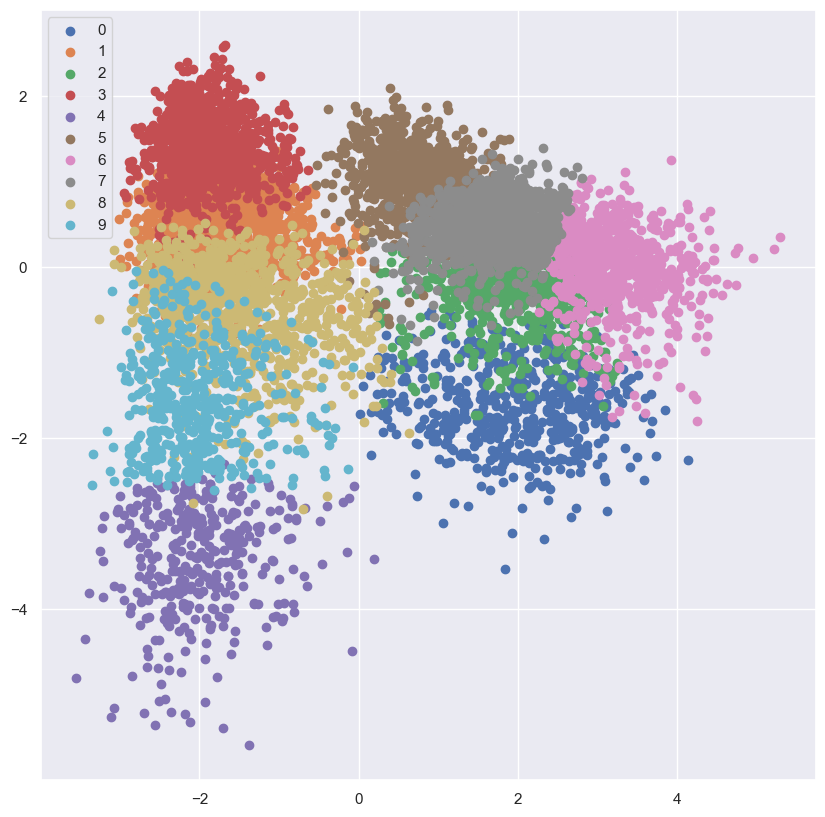

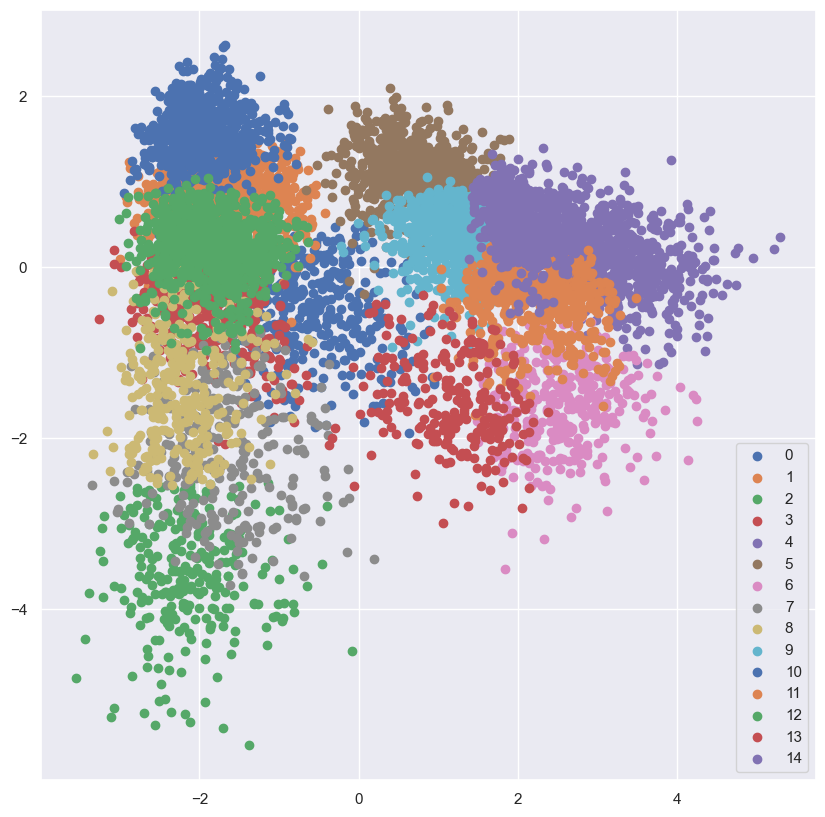

In [124]:
pca3D = PCA(n_components=3)
df_3D = pca3D.fit_transform(embeddings_beto)
df_samples_PCA_3D = pd.DataFrame(data=df_3D, columns=["pca0", "pca1", "pca2"])

clusters = [5,6,7,8,9,10,15]
silhouette_avg = []

for i in clusters:
    #Initialize the class object
    kmeans = KMeans(n_clusters=i)
     
    #predict the labels of clusters.
    label = kmeans.fit_predict(df_samples_PCA_3D)
     
    #Getting unique labels
    u_labels = np.unique(label)
     
    #plotting the results:
    for i in u_labels:
        plt.scatter(df_3D[label == i , 0] , df_3D[label == i , 1] , label = i)
    plt.legend()
    plt.show()
    
    score = silhouette_score(df_samples_PCA_3D, kmeans.labels_)
    silhouette_avg.append(score)

#### 2.3.2.2 Modelacion N° clusters - Score Silhouette

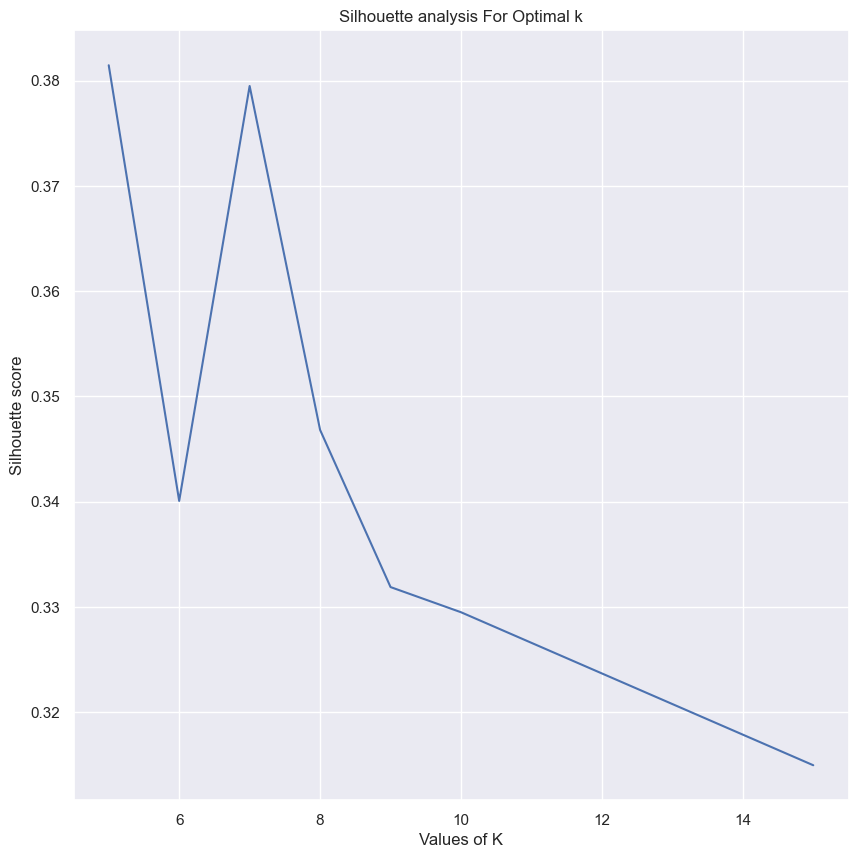

N° Clusters con mejor Score:  5 
Score:  0.3814679


In [125]:
plt.plot(clusters,silhouette_avg)
plt.xlabel("Values of K") 
plt.ylabel("Silhouette score") 
plt.title("Silhouette analysis For Optimal k")
plt.show()
print("N° Clusters con mejor Score: ",clusters[pd.Series(silhouette_avg).idxmax()],"\nScore: ",max(silhouette_avg))

#### 2.3.2.3 Modelado K-Means con N° Óptimo Clusters 3D

In [126]:
def Plot3D_WithLabels (samples_3D, labels, title, axes = {'x': 'x', 'y': 'y', 'z': 'z'}, centroids_3D=None):

  """
  samples_3D (numpy.ndarray): array tipo embedding cuyo
        shape es (num_muestras, 3) ; 3 por las tres coordenadas

  labels (array): etiqueta perteneciente a cada muestra.

  title(string): titulo de la figura que se utiliza para el plot
  """

  # First we create the dataframe
  df_samples_3D_labeled = pd.DataFrame(data=samples_3D, columns=[axes['x'], axes['y'], axes['z']])

  # Then we add the labels column
  df_samples_3D_labeled['label'] = labels.tolist()
  df_samples_3D_labeled['label'] = df_samples_3D_labeled["label"].astype(str)

  if centroids_3D is not None:
    # Same applies for centroids when these are provided as an argument
    labels_centroid_aux = np.arange(len(centroids_3D), dtype=int)
    df_centroids_3D_labeled = pd.DataFrame(data=centroids_3D, columns=[axes['x'], axes['y'], axes['z']])
    df_centroids_3D_labeled['label'] = labels_centroid_aux.tolist()

    # We create an additional column with the dot size used for each type of sample
    size_no_centroid = np.ones(len(samples_3D)) * 10 # for regular samples
    size_centroid = np.ones(len(centroids_3D)) * 50 # for centroids
    size_col = np.append(size_no_centroid, size_centroid) # new col to be added to the dataframe

    # We also create another additional column with the labels for each type of sample
    no_es_centroide_aux = [' '] * len(samples_3D) # empty label for regular samples
    es_centroide_aux = []
    for i in range(len(centroids_3D)):
      es_centroide_aux.append('C%d' % i) # Ci label for centroid i
    centroid_col = no_es_centroide_aux + es_centroide_aux # new col to be added to the dataframe

    # Next we concatenate both dataframes: first, regular samples, then, centroids
    df_samples_and_centroids = pd.concat([df_samples_3D_labeled, df_centroids_3D_labeled], ignore_index=True)
      

    # We add the new column with the labels distinguishing regular samples from centroids
    df_samples_and_centroids['centroid'] = centroid_col

    # New column is re-casted as a string column
    df_samples_and_centroids['centroid'] = df_samples_and_centroids['centroid'].astype(str)

    # We add the new column with the corresponding size for both regular samples and centroids
    df_samples_and_centroids['size'] = size_col

    # We ensure that the 'label' column is numeric since we will sort the dataframe upon this one
    df_samples_and_centroids['label'] = pd.to_numeric(df_samples_and_centroids['label'])

    # We finally sort the dataframe by the 'label' column in ascending order
    df_samples_and_centroids_sorted = df_samples_and_centroids.sort_values(by=['label'], ascending=True)

    # And plot both the samples and their corresponding centroids
    fig = px.scatter_3d(df_samples_and_centroids_sorted, x=axes['x'], y=axes['y'], z=axes['z'], text='centroid', size='size', color='label')
  else:
    # We ensure that the 'label' column is numeric since we will sort the dataframe upon this one
    df_samples_3D_labeled['label'] = pd.to_numeric(df_samples_3D_labeled['label'])

    # We finally sort the dataframe by the 'label' column in ascending order
    df_samples_and_centroids_sorted = df_samples_3D_labeled.sort_values(by=['label'], ascending=True)

    fig = px.scatter_3d(df_samples_and_centroids_sorted, x=axes['x'], y=axes['y'], z=axes['z'], color='label', size=np.ones(len(samples_3D))) #, color_continuous_scale='delta')

  fig.update_traces(textposition='top center')
  fig.update_layout(scene_aspectmode='data')
  fig.update_layout(uniformtext_minsize=60)

  fig.update_layout(title_font_size=20,
                    title={
                    'text': title,
                    'y': 0.9,
                    'x': 0.05,
                    'xanchor': 'left',
                    'yanchor': 'top'})
  # tight layout
  fig.update_layout(autosize = True, margin = dict(l=50, r=0, b=10, t=30))
  fig.show()

In [127]:
n_clusters = clusters[pd.Series(silhouette_avg).idxmax()]
kmeans = KMeans(n_clusters=n_clusters)
label = kmeans.fit_predict(df_samples_PCA_3D)
axes_PCA_3D = {'x': 'pca0', 'y': 'pca1', 'z': 'pca2'}

title = f'K-means(K={n_clusters}) over 3D PCA transformed data'
plot = Plot3D_WithLabels (df_samples_PCA_3D, kmeans.labels_, title, axes_PCA_3D, centroids_3D=kmeans.cluster_centers_)

### 2.3.3 t-SNE 2D

#### 2.3.3.1 Reducción de Dimensión

In [129]:
tsne2D = TSNE(n_components=2)
samples_TSNE_2D = tsne2D.fit_transform(embeddings_beto)
df_samples_TSNE_2D = pd.DataFrame(data=samples_TSNE_2D, columns=["tsne0", "tsne1"])

#### 2.3.3.2 Modelación Nearest Neighbor

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



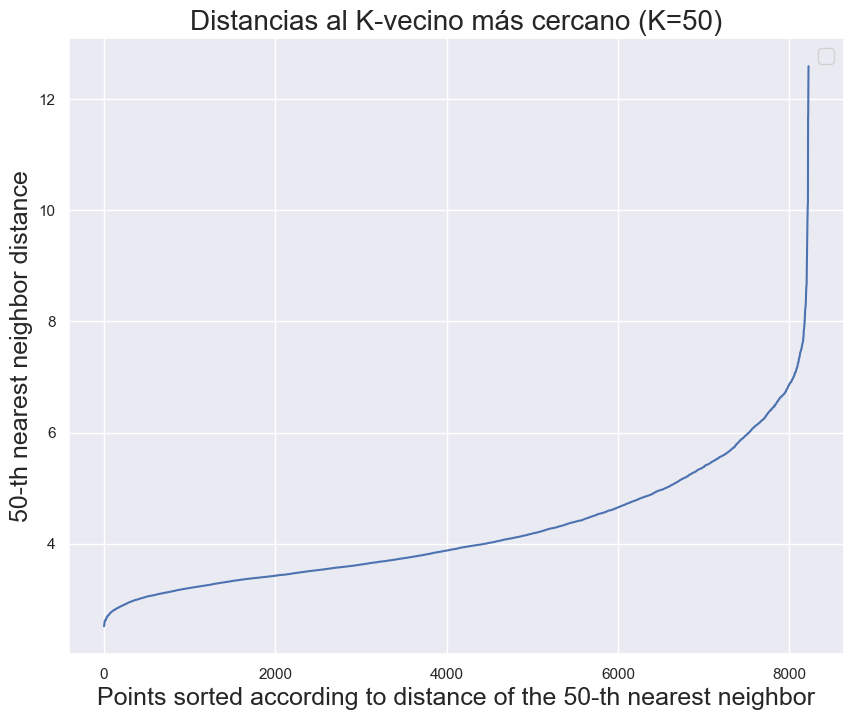

In [130]:
PlotDistancesToKnearestNeighbor(samples_TSNE_2D, 50) # notese que el parametro de entrada NO es samples

#### 2.3.3.3 DBScan t-SNE 2D

##### 2.3.3.3.1 Epsilons Score Silhouette 

In [131]:
min_samples = 50
epsilon_values = [4, 4.05, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.9, 5, 5.2, 5.4, 5.6]
aux_labels = {}
for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData (samples_TSNE_2D, epsilon, min_samples=min_samples)


Test for epsilon = 4
Estimated number of clusters: 14
Estimated number of noise points: 1180
Silhouette Coefficient: 0.268

Test for epsilon = 4.05
Estimated number of clusters: 14
Estimated number of noise points: 1074
Silhouette Coefficient: 0.280

Test for epsilon = 4.1
Estimated number of clusters: 14
Estimated number of noise points: 990
Silhouette Coefficient: 0.288

Test for epsilon = 4.2
Estimated number of clusters: 14
Estimated number of noise points: 835
Silhouette Coefficient: 0.300

Test for epsilon = 4.3
Estimated number of clusters: 14
Estimated number of noise points: 720
Silhouette Coefficient: 0.311

Test for epsilon = 4.4
Estimated number of clusters: 14
Estimated number of noise points: 618
Silhouette Coefficient: 0.320

Test for epsilon = 4.5
Estimated number of clusters: 15
Estimated number of noise points: 497
Silhouette Coefficient: 0.302

Test for epsilon = 4.6
Estimated number of clusters: 14
Estimated number of noise points: 392
Silhouette Coefficient: 0.333

In [139]:
epsilon = 4.6
labels_TSNE_2D = aux_labels[epsilon]

##### 2.3.3.3.2 Visualización DBScan t-SNE 2D

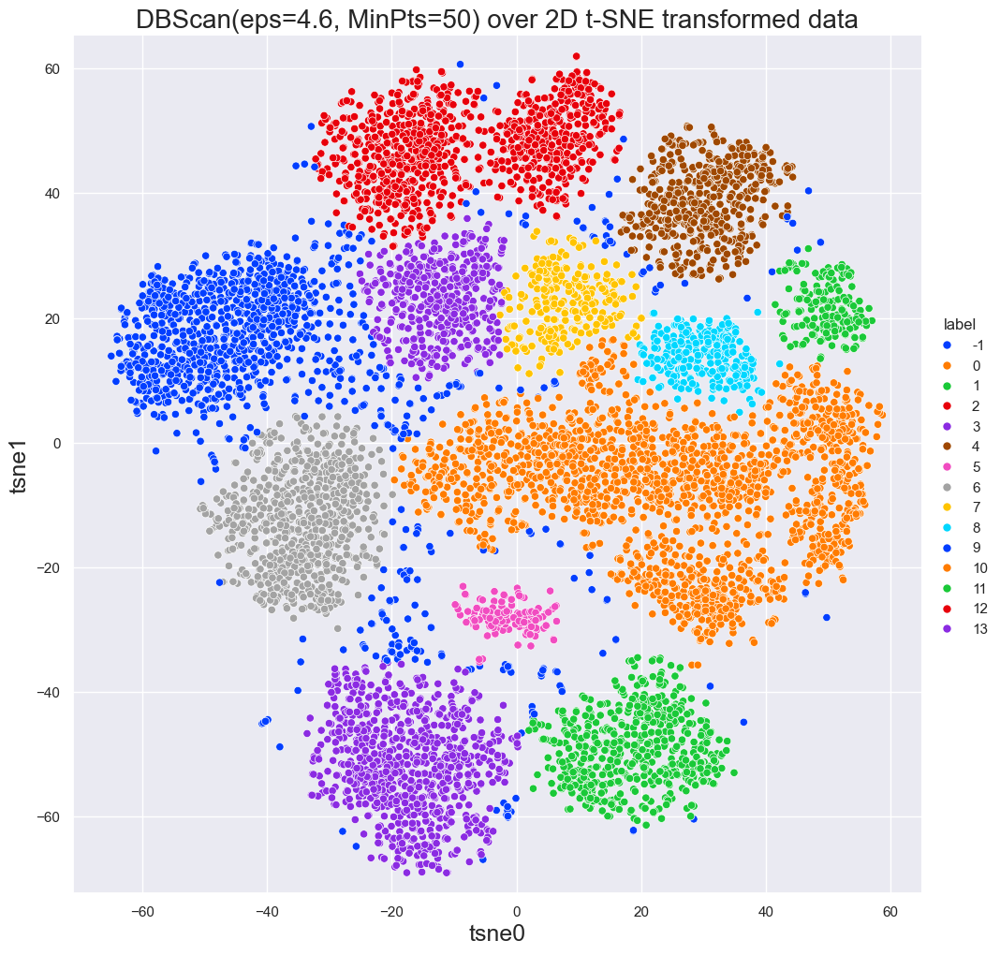

In [140]:
title = f'DBScan(eps={epsilon}, MinPts={min_samples}) over 2D t-SNE transformed data'
Plot2D_WithLabels (samples_TSNE_2D, labels_TSNE_2D, title, axes_TSNE_2D)

### 2.3.4 t-SNE 3D

#### 2.3.4.1 Reducción de Dimensión

In [141]:
tsne3D = TSNE(n_components=3)
samples_TSNE_3D = tsne3D.fit_transform(embeddings_beto)
df_samples_TSNE_3D = pd.DataFrame(data=samples_TSNE_3D, columns=["tsne0", "tsne1", "tsne2"])

#### 2.3.4.2 Modelación Nearest Neighbor

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



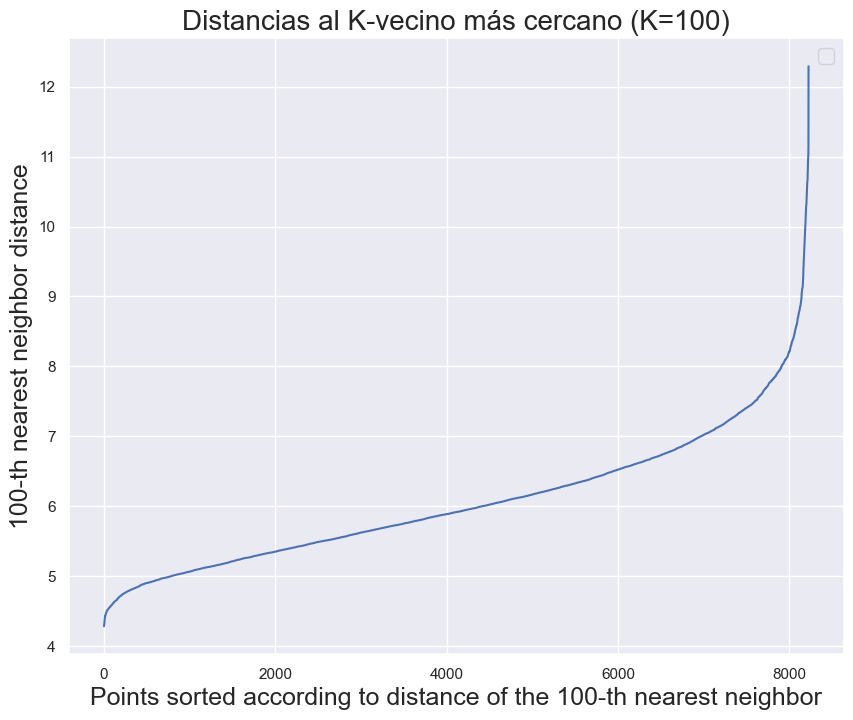

In [142]:
PlotDistancesToKnearestNeighbor(samples_TSNE_3D, 100)

#### 2.3.4.3 DBScan t-SNE 3D

##### 2.3.4.3.1 Epsilons Score Silhouette

In [143]:
min_samples = 100
epsilon_values = [5.1,5.2,5.25,5.3, 5.35, 5.4, 5.5, 5.6]
aux_labels = {}
for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData (samples_TSNE_3D, epsilon, min_samples=min_samples)


Test for epsilon = 5.1
Estimated number of clusters: 13
Estimated number of noise points: 2311
Silhouette Coefficient: 0.135

Test for epsilon = 5.2
Estimated number of clusters: 14
Estimated number of noise points: 1649
Silhouette Coefficient: 0.187

Test for epsilon = 5.25
Estimated number of clusters: 13
Estimated number of noise points: 1467
Silhouette Coefficient: 0.205

Test for epsilon = 5.3
Estimated number of clusters: 13
Estimated number of noise points: 1253
Silhouette Coefficient: 0.221

Test for epsilon = 5.35
Estimated number of clusters: 11
Estimated number of noise points: 1081
Silhouette Coefficient: 0.231

Test for epsilon = 5.4
Estimated number of clusters: 11
Estimated number of noise points: 862
Silhouette Coefficient: 0.242

Test for epsilon = 5.5
Estimated number of clusters: 10
Estimated number of noise points: 636
Silhouette Coefficient: 0.227

Test for epsilon = 5.6
Estimated number of clusters: 7
Estimated number of noise points: 458
Silhouette Coefficient: 

In [144]:
epsilon = 5.35
labels_TSNE_3D = aux_labels[epsilon]

##### 2.3.4.3.2 Visualización DBScan t-SNE 3D

In [146]:
title = f'DBScan(eps={epsilon}, MinPts={min_samples}) over 3D t-SNE transformed data'
axes_TSNE_3D = {'x': 'tsne0', 'y': 'tsne1' , 'z': 'tsne2'}
Plot3D_WithLabels (samples_TSNE_3D, labels_TSNE_3D, title, axes_TSNE_3D)

### 2.3.5 DBScan PCA


#### 2.3.5.1 DBScan - PCA 2D

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



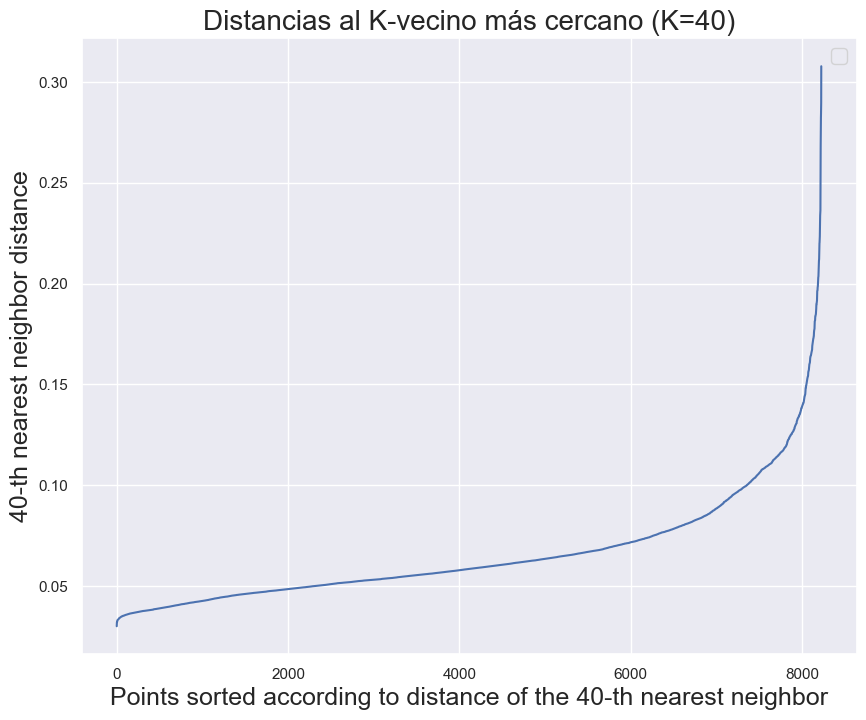

In [193]:
n_samples = 40
PlotDistancesToKnearestNeighbor(df_samples_PCA_2D, n_samples)

In [151]:
epsis = [0.3,0.31,0.32,0.33,0.34,0.35,0.37,0.39,0.4,0.42,0.44,0.46,0.47,0.48,0.49,0.5]
aux_labels = {}
for epsilon in epsis:
  aux_labels[epsilon] = ApplyDBScanToData (df_samples_PCA_2D, epsilon, min_samples=min_samples)


Test for epsilon = 0.3
Estimated number of clusters: 2
Estimated number of noise points: 2226
Silhouette Coefficient: 0.421

Test for epsilon = 0.31
Estimated number of clusters: 2
Estimated number of noise points: 2118
Silhouette Coefficient: 0.433

Test for epsilon = 0.32
Estimated number of clusters: 2
Estimated number of noise points: 2010
Silhouette Coefficient: 0.444

Test for epsilon = 0.33
Estimated number of clusters: 2
Estimated number of noise points: 1909
Silhouette Coefficient: 0.455

Test for epsilon = 0.34
Estimated number of clusters: 2
Estimated number of noise points: 1831
Silhouette Coefficient: 0.462

Test for epsilon = 0.35
Estimated number of clusters: 2
Estimated number of noise points: 1726
Silhouette Coefficient: 0.470

Test for epsilon = 0.37
Estimated number of clusters: 2
Estimated number of noise points: 1493
Silhouette Coefficient: 0.484

Test for epsilon = 0.39
Estimated number of clusters: 2
Estimated number of noise points: 1268
Silhouette Coefficient:

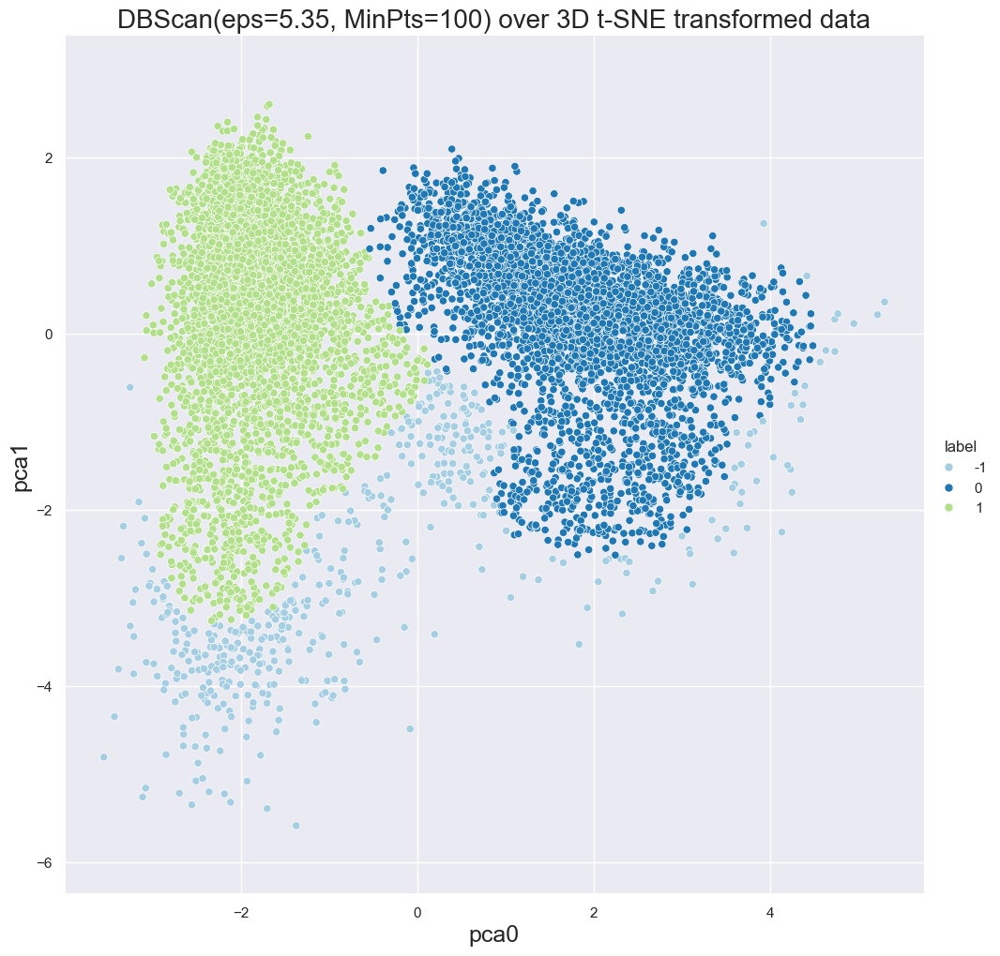

In [ ]:
epsilon = 0.48
labels_PCA_2D = aux_labels[epsilon]
title = f'K-means(K={n_clusters}) over 2D PCA transformed data'
Plot2D_WithLabels (df_samples_PCA_2D, labels_PCA_2D, title, axes_PCA_2D, palette="Paired")

#### 2.3.5.2 DBScan - PCA 3D

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



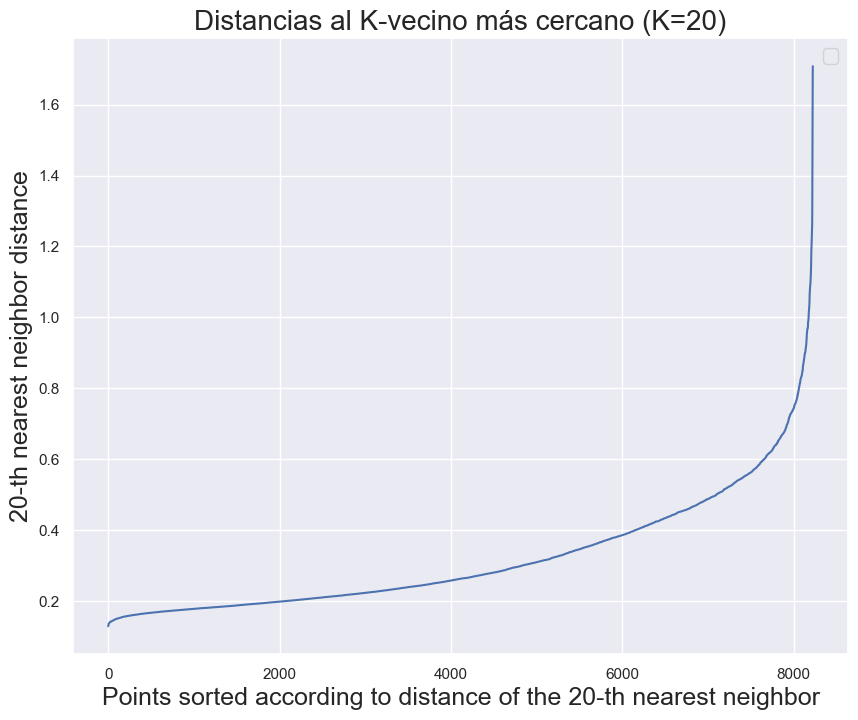

In [153]:
n_samples = 20
PlotDistancesToKnearestNeighbor(df_samples_PCA_3D, n_samples)

In [154]:
epsis = [0.2,0.28,0.29,0.3,0.31,0.32,0.33,0.34,0.35,0.37,0.39,0.4,0.41,0.42,0.43,0.44,0.45,0.46,0.47,0.48]
data_epsis = []
min_samples = n_samples

#epsis = [0.2,0.28,0.29,0.3,0.31,0.32,0.33,0.34,0.35,0.37,0.39,0.4]
aux_labels = {}
for epsilon in epsis:
  aux_labels[epsilon] = ApplyDBScanToData (df_samples_PCA_3D, epsilon, min_samples=min_samples)


Test for epsilon = 0.2
Estimated number of clusters: 5
Estimated number of noise points: 4608
Silhouette Coefficient: -0.238

Test for epsilon = 0.28
Estimated number of clusters: 3
Estimated number of noise points: 2627
Silhouette Coefficient: 0.220

Test for epsilon = 0.29
Estimated number of clusters: 3
Estimated number of noise points: 2487
Silhouette Coefficient: 0.232

Test for epsilon = 0.3
Estimated number of clusters: 5
Estimated number of noise points: 2326
Silhouette Coefficient: 0.096

Test for epsilon = 0.31
Estimated number of clusters: 5
Estimated number of noise points: 2225
Silhouette Coefficient: 0.106

Test for epsilon = 0.32
Estimated number of clusters: 5
Estimated number of noise points: 2113
Silhouette Coefficient: 0.140

Test for epsilon = 0.33
Estimated number of clusters: 8
Estimated number of noise points: 1958
Silhouette Coefficient: 0.021

Test for epsilon = 0.34
Estimated number of clusters: 7
Estimated number of noise points: 1831
Silhouette Coefficient:

In [157]:
epsilon = 0.42
labels_PCA_3D = aux_labels[epsilon]
Plot3D_WithLabels (df_samples_PCA_3D, labels_PCA_3D, title, axes_PCA_3D)

# 3 Embedding MARIA

## 3.1 Carga de Datos

In [158]:
embeddings_maria = np.load("EmoEvalEs-embeddings-MARIA.npy")


## 3.2 Sin reducción de dimensionalidad

### 3.2.1 Nearest Neighbor

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



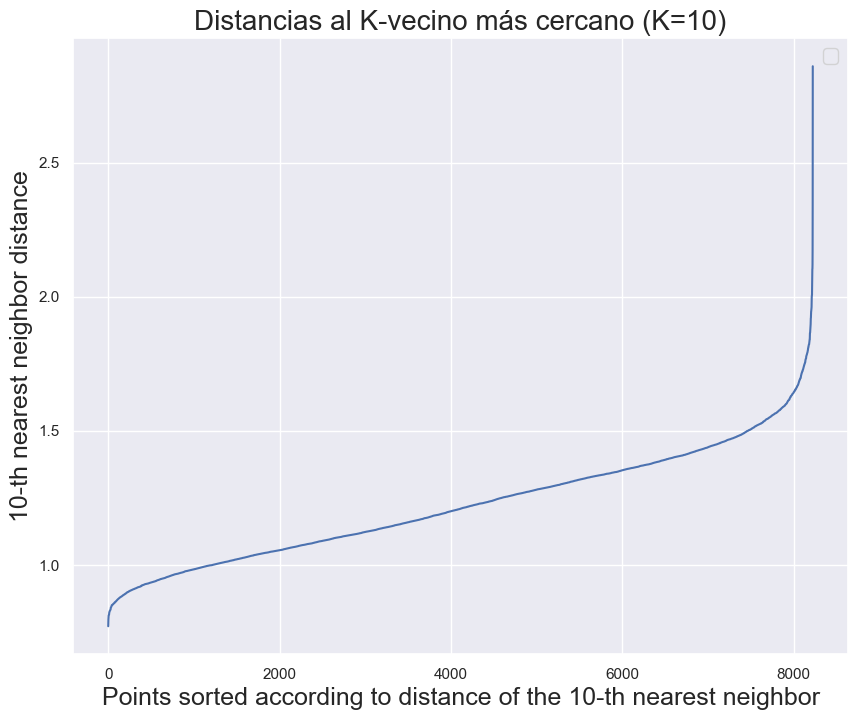

In [159]:
PlotDistancesToKnearestNeighbor(embeddings_maria, 10)

### 3.2.2 DBScan sin Reducción de Dimensionalidad

In [160]:
min_samples = 10
epsilon_values = [0.8,1,1.2,1.3,1.4,1.5,1.6,1.7,1.8]
aux_labels = {}
for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData(embeddings_maria, epsilon, min_samples=min_samples)


Test for epsilon = 0.8
Estimated number of clusters: 2
Estimated number of noise points: 8193
Silhouette Coefficient: -0.122

Test for epsilon = 1
Estimated number of clusters: 2
Estimated number of noise points: 6006
Silhouette Coefficient: -0.073

Test for epsilon = 1.2
Estimated number of clusters: 2
Estimated number of noise points: 3192
Silhouette Coefficient: 0.061

Test for epsilon = 1.3
Estimated number of clusters: 1
Estimated number of noise points: 1705
Silhouette Coefficient: 0.103

Test for epsilon = 1.4
Estimated number of clusters: 1
Estimated number of noise points: 735
Silhouette Coefficient: 0.129

Test for epsilon = 1.5
Estimated number of clusters: 1
Estimated number of noise points: 275
Silhouette Coefficient: 0.162

Test for epsilon = 1.6
Estimated number of clusters: 1
Estimated number of noise points: 116
Silhouette Coefficient: 0.197

Test for epsilon = 1.7
Estimated number of clusters: 1
Estimated number of noise points: 47
Silhouette Coefficient: 0.224

Test

In [161]:
epsilon = 1.8
labels = aux_labels[epsilon]

### 3.2.3 K-Means sin PCA

In [162]:
for i in range(2,20):
    km = KMeans(n_clusters=i, init='random', max_iter=200, random_state=0).fit(embeddings_maria)
    sample_km = km.labels_
    score = metrics.silhouette_score(embeddings_maria, sample_km)
    print("cantidad de cluster:", i)
    print("Silhouette Coefficient: %0.3f" % score)

cantidad de cluster: 2
Silhouette Coefficient: 0.085
cantidad de cluster: 3
Silhouette Coefficient: 0.100
cantidad de cluster: 4
Silhouette Coefficient: 0.112
cantidad de cluster: 5
Silhouette Coefficient: 0.114
cantidad de cluster: 6
Silhouette Coefficient: 0.105
cantidad de cluster: 7
Silhouette Coefficient: 0.085
cantidad de cluster: 8
Silhouette Coefficient: 0.083
cantidad de cluster: 9
Silhouette Coefficient: 0.077
cantidad de cluster: 10
Silhouette Coefficient: 0.081
cantidad de cluster: 11
Silhouette Coefficient: 0.068
cantidad de cluster: 12
Silhouette Coefficient: 0.078
cantidad de cluster: 13
Silhouette Coefficient: 0.073
cantidad de cluster: 14
Silhouette Coefficient: 0.067
cantidad de cluster: 15
Silhouette Coefficient: 0.068
cantidad de cluster: 16
Silhouette Coefficient: 0.068
cantidad de cluster: 17
Silhouette Coefficient: 0.072
cantidad de cluster: 18
Silhouette Coefficient: 0.071
cantidad de cluster: 19
Silhouette Coefficient: 0.072


## 3.3 Con reducción de dimensionalidad

### 3.3.1 K-Means PCA 2D

#### 3.3.1.1 Búsqueda N° óptimo CLusters

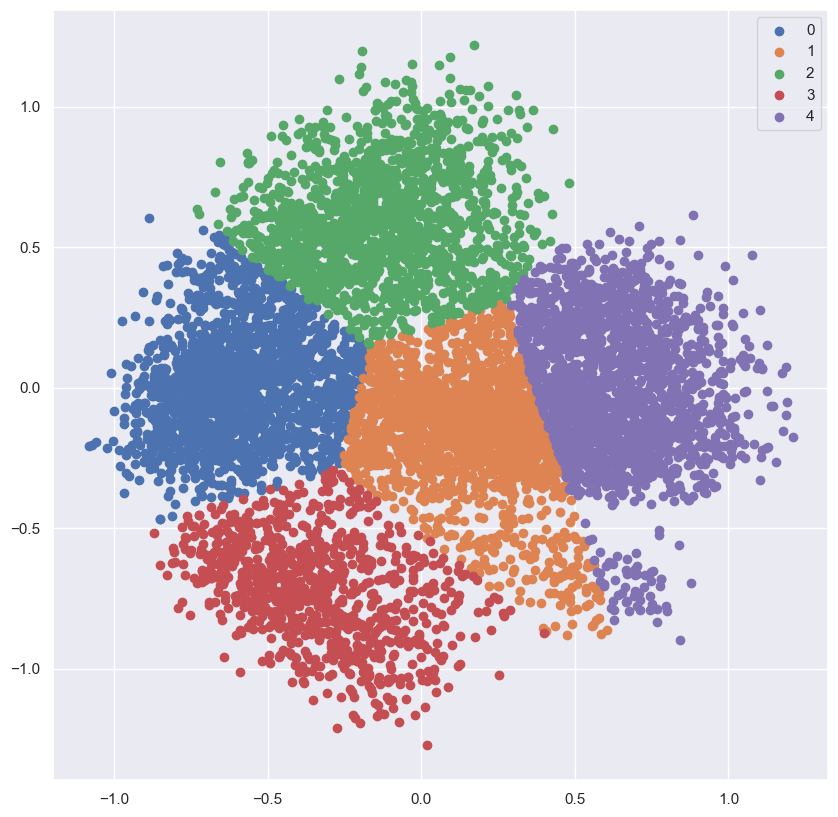

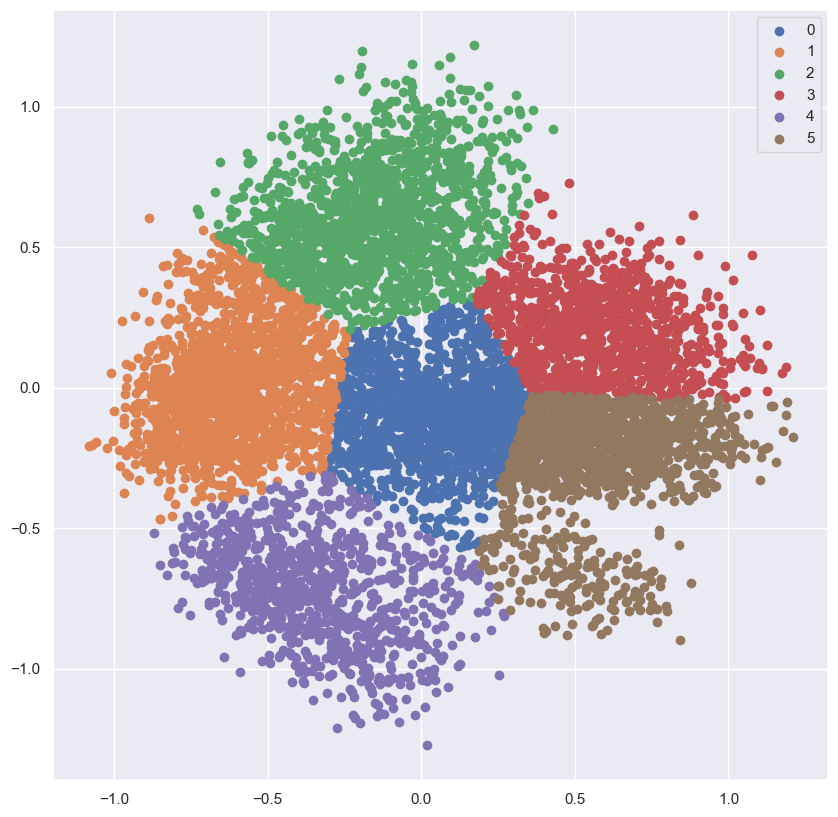

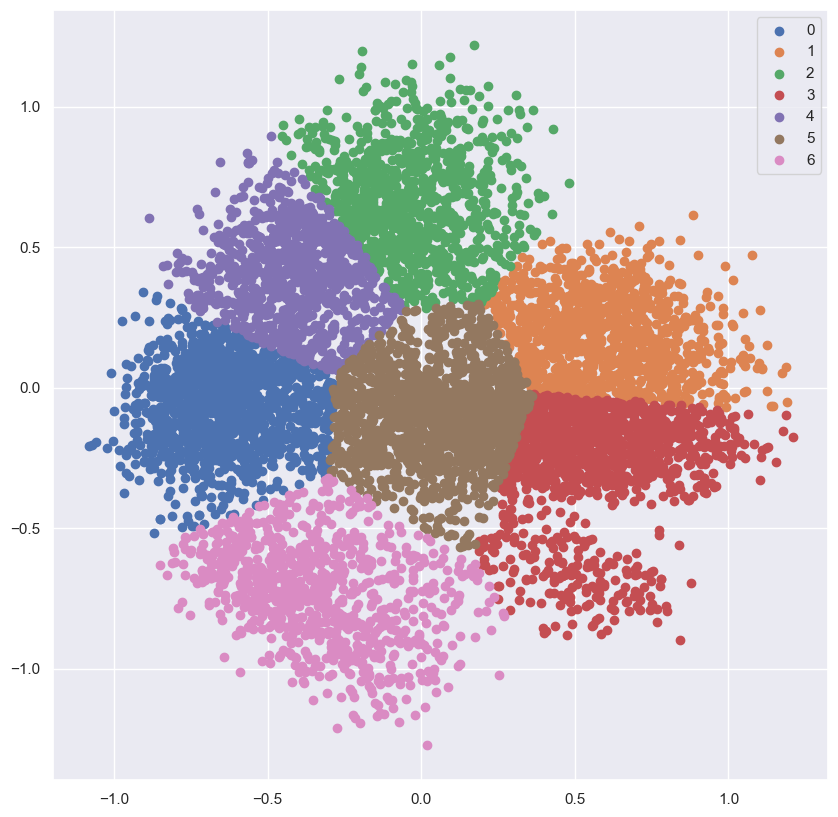

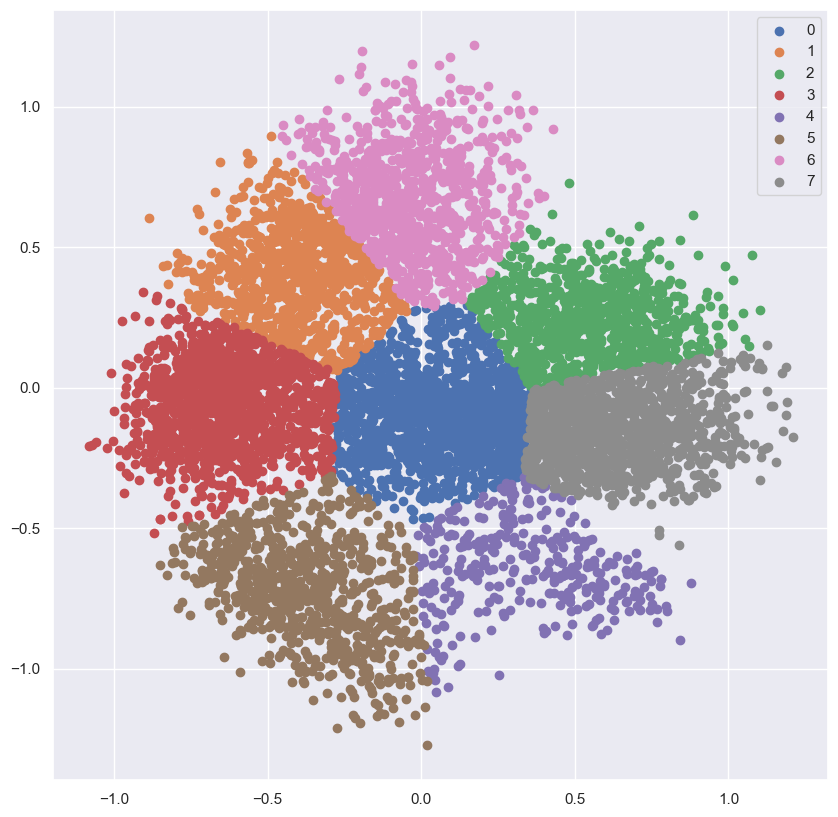

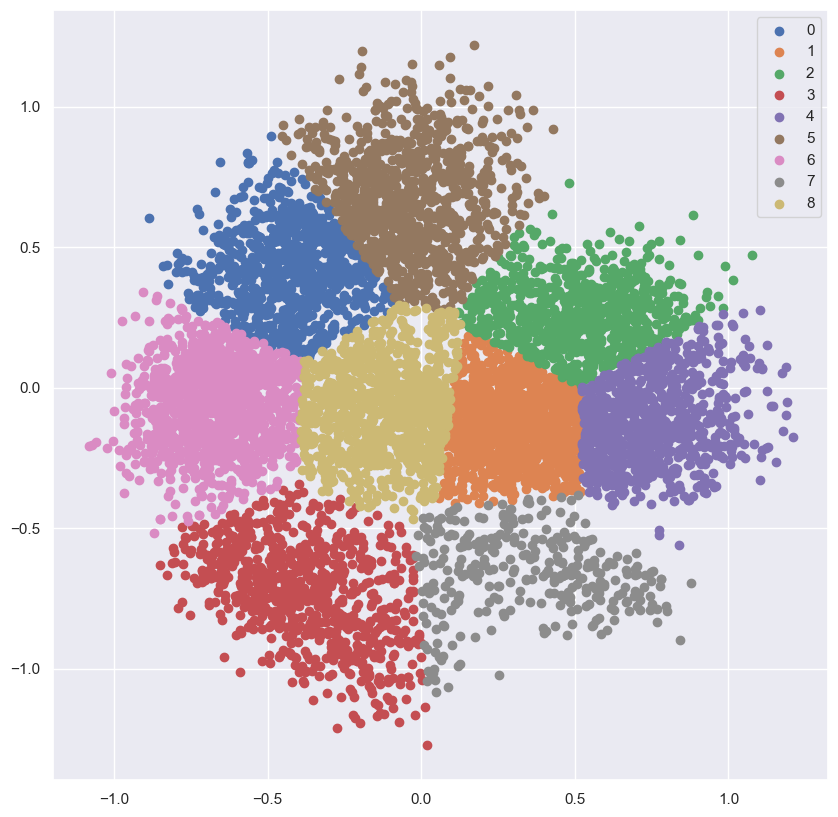

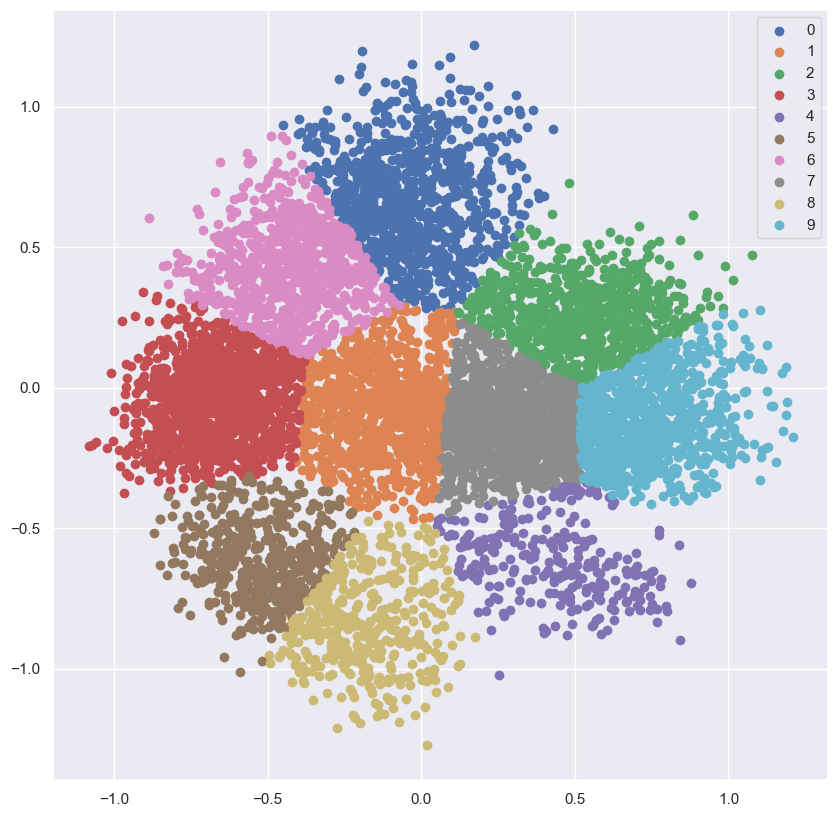

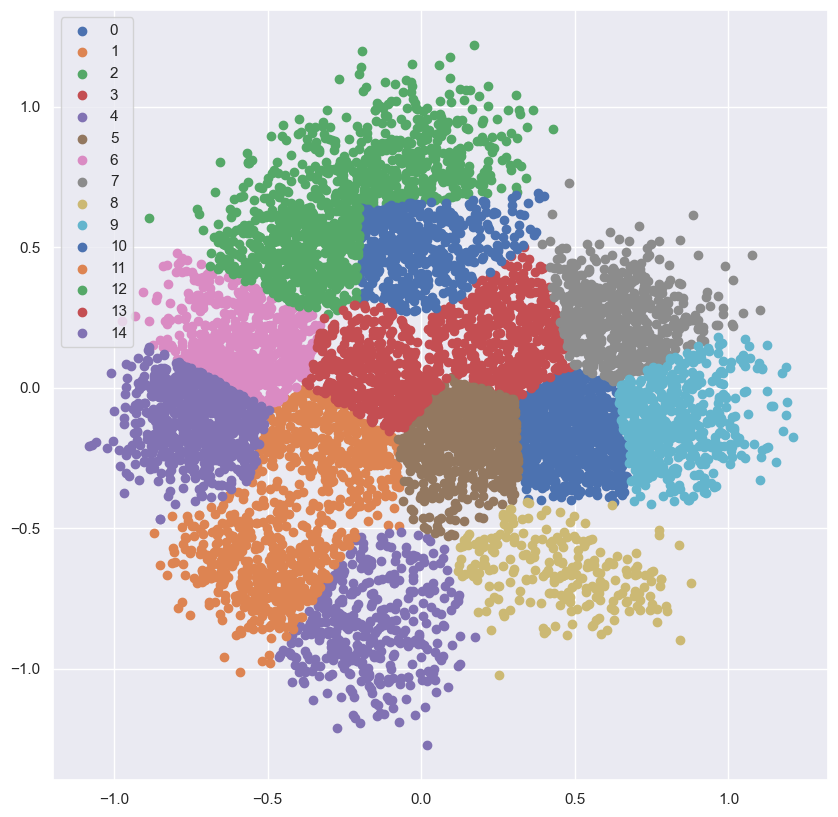

In [163]:
# Raw Data
pca2D = PCA(2)
 
#Transform the data
df_2D = pca2D.fit_transform(embeddings_maria)

df_samples_PCA_2D = pd.DataFrame(data=df_2D, columns=["pca0", "pca1"])

clusters = [5,6,7,8,9,10,15]
silhouette_avg = []

for i in clusters:
    #Initialize the class object
    kmeans = KMeans(n_clusters=i)
     
    #predict the labels of clusters.
    label = kmeans.fit_predict(df_samples_PCA_2D)
     
    #Getting unique labels
    u_labels = np.unique(label)
     
    #plotting the results:
    for i in u_labels:
        plt.scatter(df_2D[label == i , 0] , df_2D[label == i , 1] , label = i)
    plt.legend()
    plt.show()
    
    score = silhouette_score(df_samples_PCA_2D, kmeans.labels_)
    silhouette_avg.append(score)

#### 3.3.1.2 Modelacion N° clusters - Score Silhouette

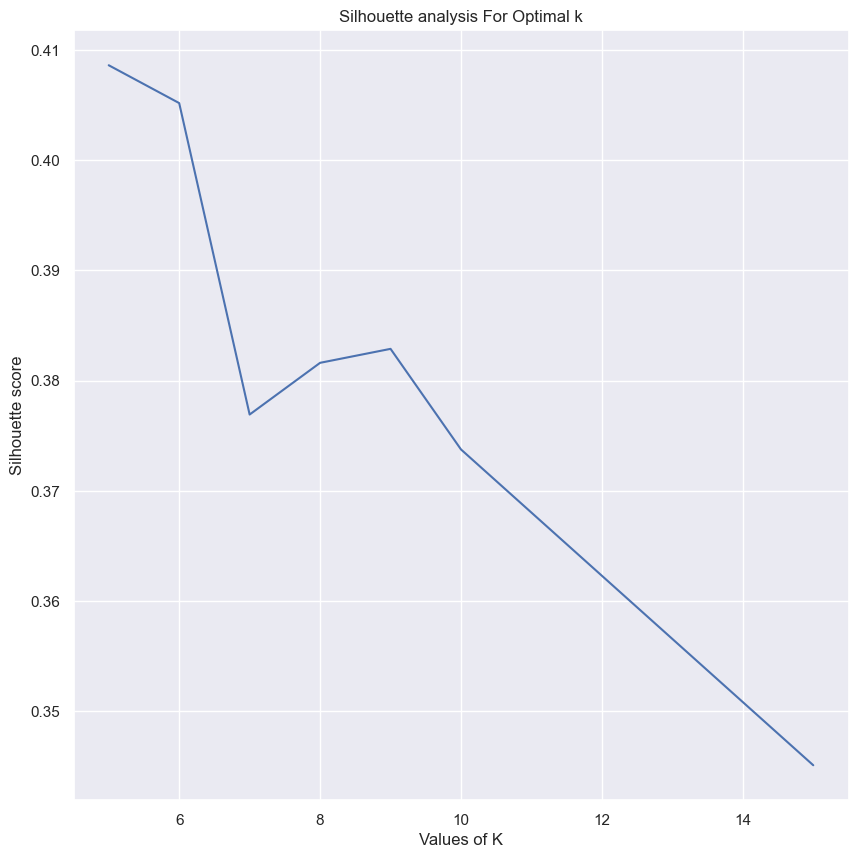

N° Clusters con mejor Score:  5 
Score:  0.40860283


In [164]:
plt.plot(clusters,silhouette_avg)
plt.xlabel("Values of K") 
plt.ylabel("Silhouette score") 
plt.title("Silhouette analysis For Optimal k")
plt.show()
print("N° Clusters con mejor Score: ",clusters[pd.Series(silhouette_avg).idxmax()],"\nScore: ",max(silhouette_avg))

#### 3.3.1.3 Modelado K-Means con N° Óptimo Clusters 2D

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\136881814.py:3: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



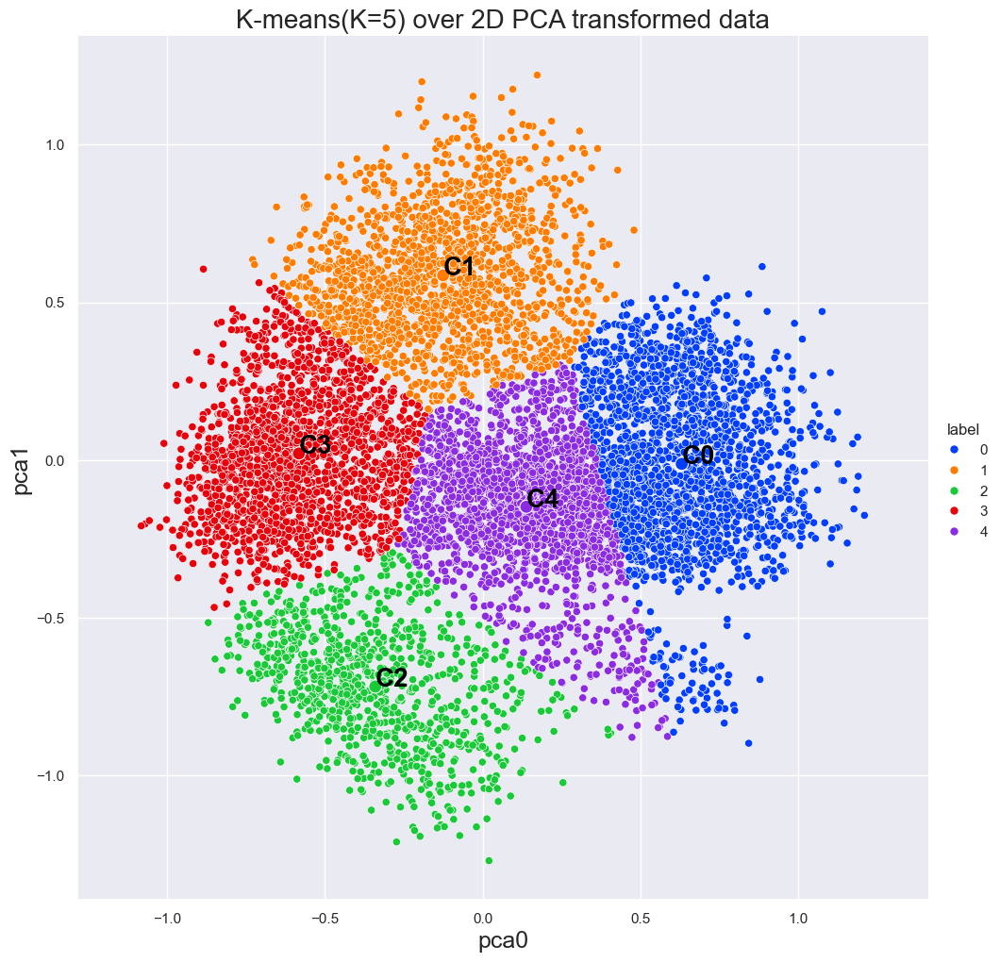

In [165]:
n_clusters = clusters[pd.Series(silhouette_avg).idxmax()]
kmeans = KMeans(n_clusters=n_clusters)
label = kmeans.fit_predict(df_samples_PCA_2D)

axes_PCA = {'x': 'pca0', 'y': 'pca1'}
title = f'K-means(K={n_clusters}) over 2D PCA transformed data'
plot = Plot2D_WithLabels(df_samples_PCA_2D, kmeans.labels_, title, axes_PCA, centroids_2D=kmeans.cluster_centers_)

### 3.3.2 K-Means PCA 3D

#### 3.3.2.1 Búsqueda N° óptimo Clusters

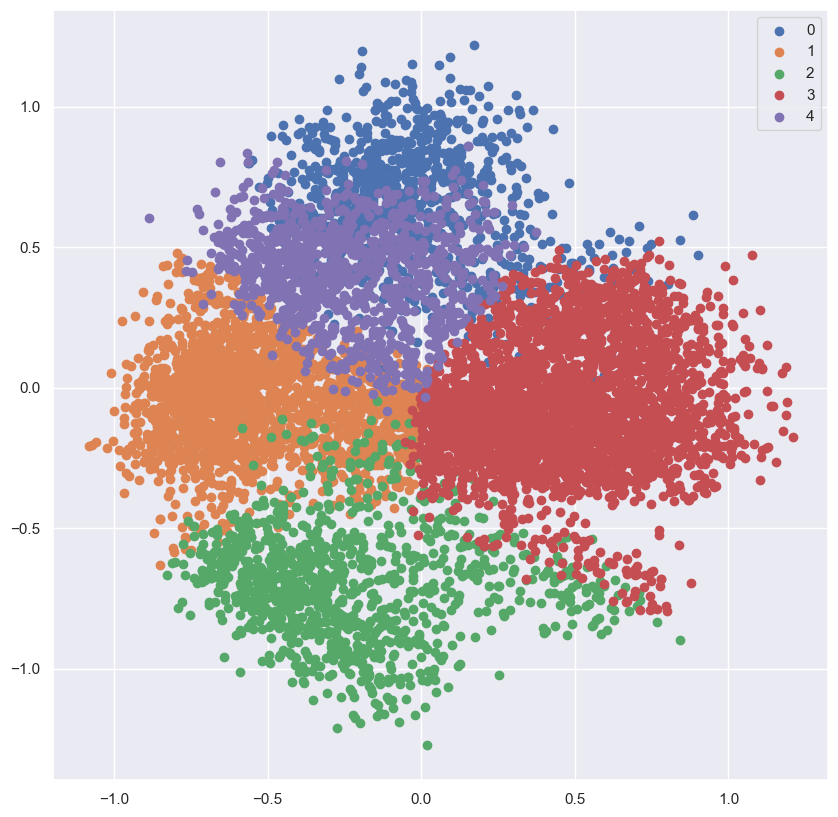

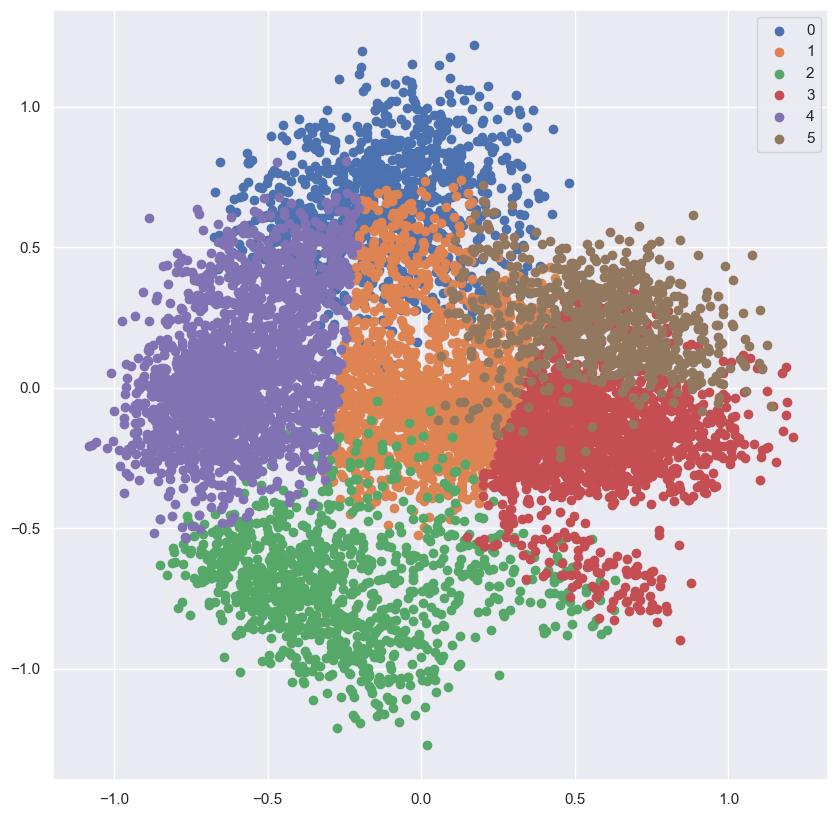

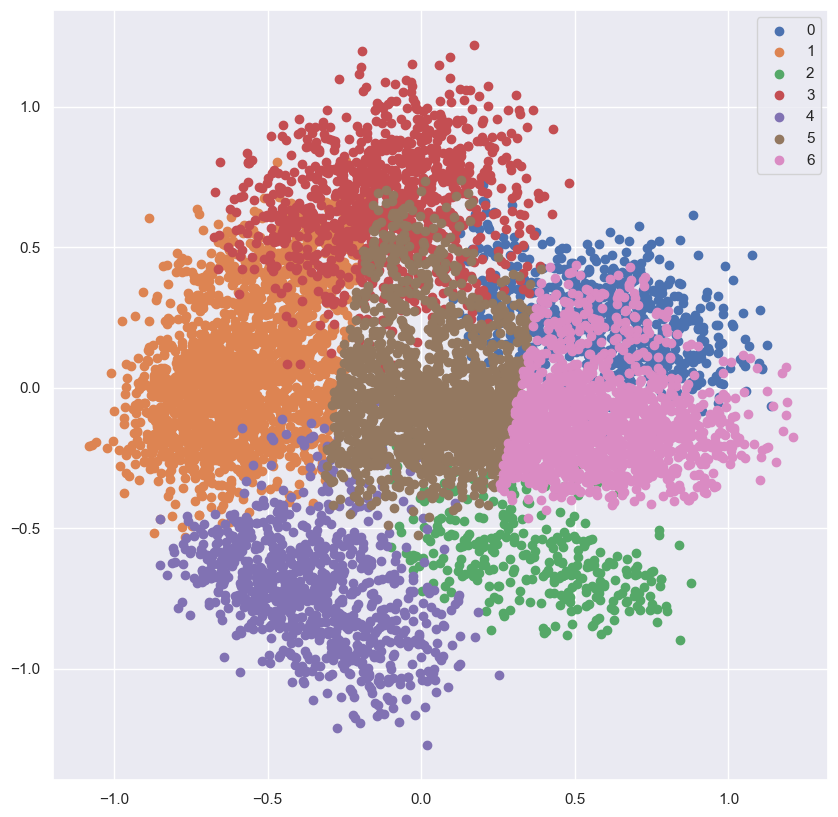

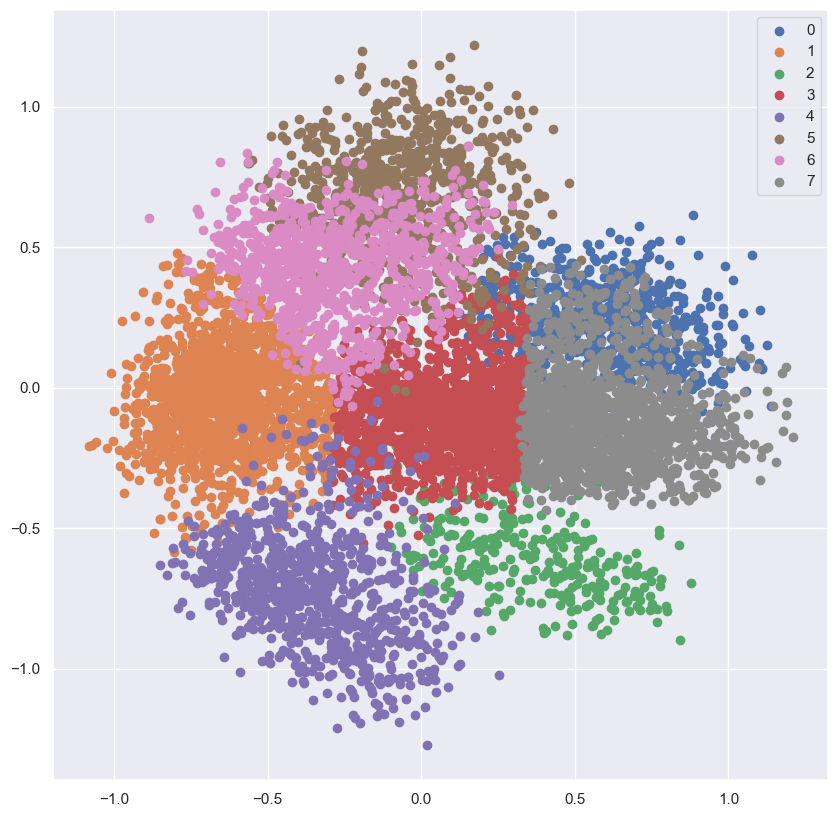

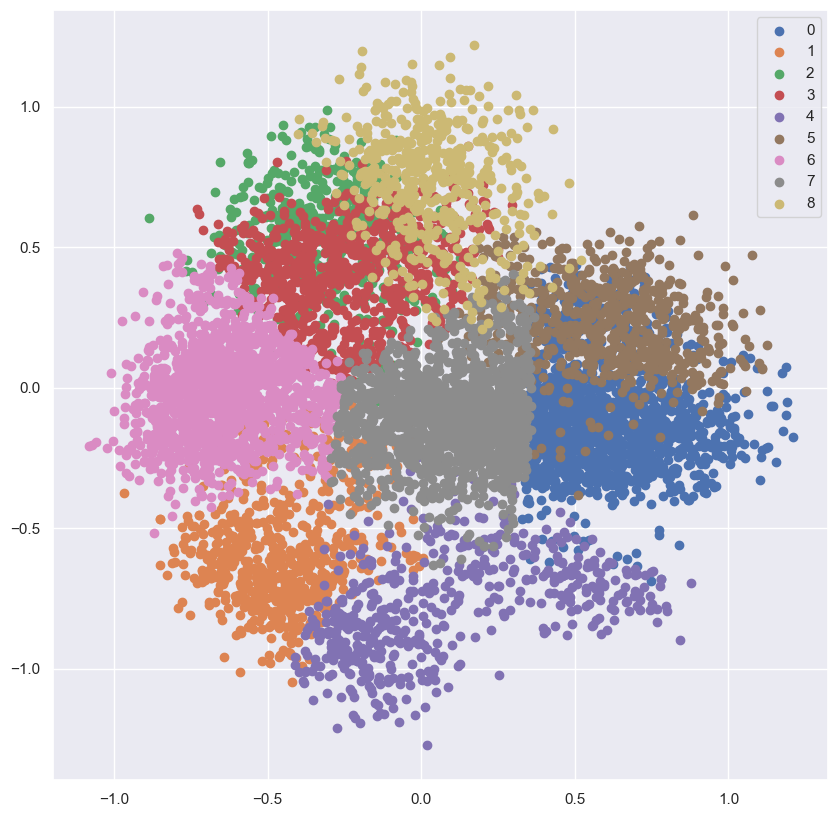

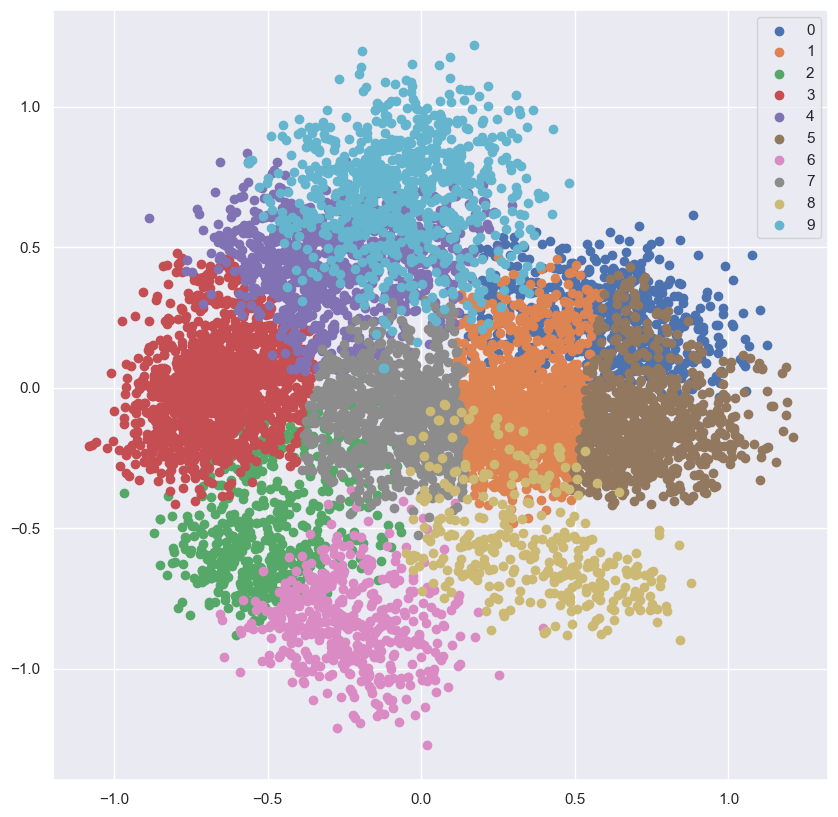

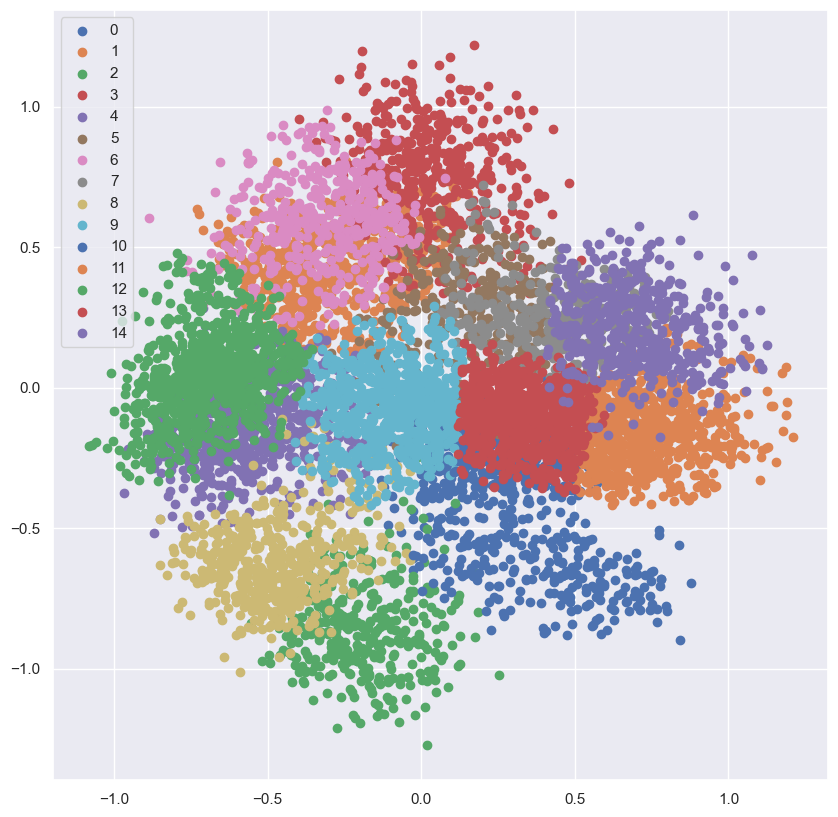

In [166]:
pca3D = PCA(n_components=3)
df_3D = pca3D.fit_transform(embeddings_maria)
df_samples_PCA_3D = pd.DataFrame(data=df_3D, columns=["pca0", "pca1", "pca2"])

clusters = [5,6,7,8,9,10,15]
silhouette_avg = []

for i in clusters:
    #Initialize the class object
    kmeans = KMeans(n_clusters=i)
     
    #predict the labels of clusters.
    label = kmeans.fit_predict(df_samples_PCA_3D)
     
    #Getting unique labels
    u_labels = np.unique(label)
     
    #plotting the results:
    for i in u_labels:
        plt.scatter(df_3D[label == i , 0] , df_3D[label == i , 1] , label = i)
    plt.legend()
    plt.show()
    
    score = silhouette_score(df_samples_PCA_3D, kmeans.labels_)
    silhouette_avg.append(score)

#### 3.3.2.2 Modelacion N° clusters - Score Silhouette

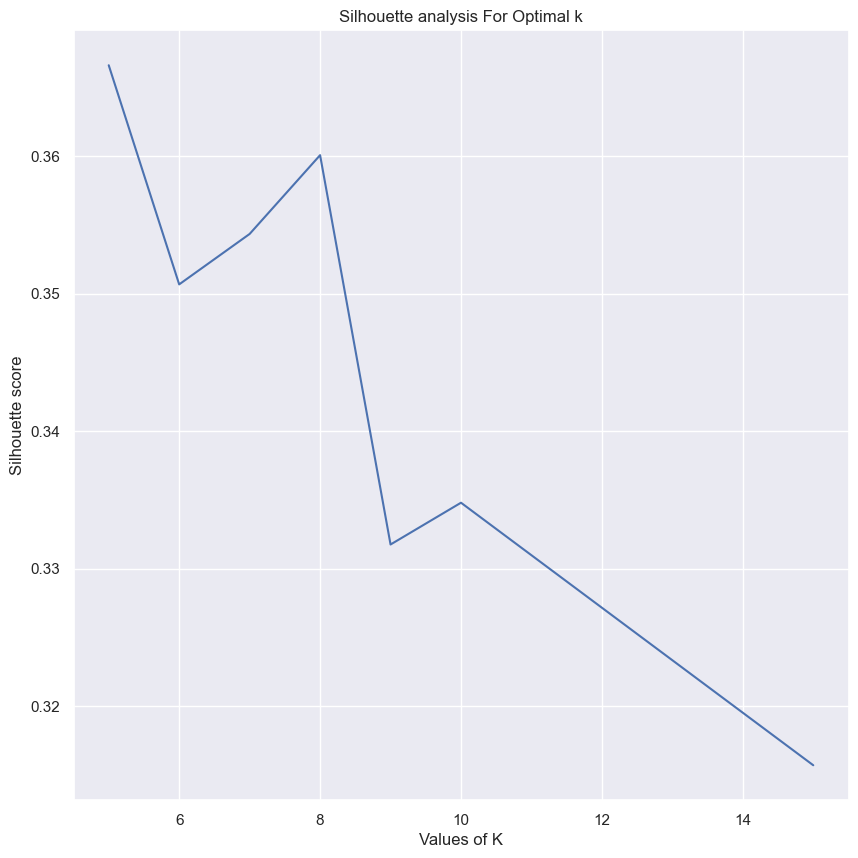

N° Clusters con mejor Score:  5 
Score:  0.36662796


In [167]:
plt.plot(clusters,silhouette_avg)
plt.xlabel("Values of K") 
plt.ylabel("Silhouette score") 
plt.title("Silhouette analysis For Optimal k")
plt.show()
print("N° Clusters con mejor Score: ",clusters[pd.Series(silhouette_avg).idxmax()],"\nScore: ",max(silhouette_avg))

#### 3.3.2.3 Modelado K-Means con N° Óptimo Clusters 3D

In [168]:
n_clusters = clusters[pd.Series(silhouette_avg).idxmax()]
kmeans = KMeans(n_clusters=n_clusters)
label = kmeans.fit_predict(df_samples_PCA_3D)
axes_PCA_3D = {'x': 'pca0', 'y': 'pca1', 'z': 'pca2'}

title = f'K-means(K={n_clusters}) over 3D PCA transformed data'
plot = Plot3D_WithLabels (df_samples_PCA_3D, kmeans.labels_, title, axes_PCA_3D, centroids_3D=kmeans.cluster_centers_)

### 3.3.3 t-SNE 2D

#### 3.3.3.1 Reducción de Dimensión

In [169]:
tsne2D = TSNE(n_components=2)
samples_TSNE_2D = tsne2D.fit_transform(embeddings_maria)
df_samples_TSNE_2D = pd.DataFrame(data=samples_TSNE_2D, columns=["tsne0", "tsne1"])

#### 3.3.3.2 Modelación Nearest Neighbor

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



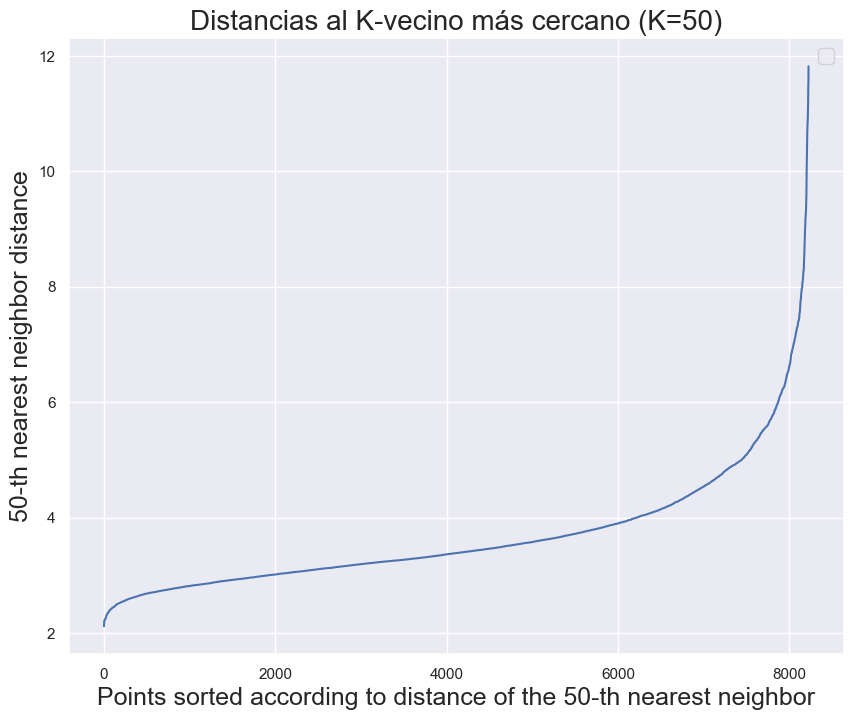

In [170]:
PlotDistancesToKnearestNeighbor(samples_TSNE_2D, 50) # notese que el parametro de entrada NO es samples

#### 3.3.3.3 DBScan t-SNE 2D

##### 3.3.3.3.1 Epsilons Score Silhouette 

In [171]:
min_samples = 50
epsilon_values = [4.6, 4.7,4.8, 4.9, 4.95, 5, 5.05, 5.1, 5.2, 5.4, 5.6]
aux_labels = {}
for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData (samples_TSNE_2D, epsilon, min_samples=min_samples)


Test for epsilon = 4.6
Estimated number of clusters: 9
Estimated number of noise points: 197
Silhouette Coefficient: 0.423

Test for epsilon = 4.7
Estimated number of clusters: 8
Estimated number of noise points: 178
Silhouette Coefficient: 0.366

Test for epsilon = 4.8
Estimated number of clusters: 7
Estimated number of noise points: 129
Silhouette Coefficient: 0.441

Test for epsilon = 4.9
Estimated number of clusters: 7
Estimated number of noise points: 117
Silhouette Coefficient: 0.441

Test for epsilon = 4.95
Estimated number of clusters: 7
Estimated number of noise points: 111
Silhouette Coefficient: 0.441

Test for epsilon = 5
Estimated number of clusters: 7
Estimated number of noise points: 98
Silhouette Coefficient: 0.439

Test for epsilon = 5.05
Estimated number of clusters: 7
Estimated number of noise points: 83
Silhouette Coefficient: 0.439

Test for epsilon = 5.1
Estimated number of clusters: 7
Estimated number of noise points: 78
Silhouette Coefficient: 0.438

Test for e

In [172]:
epsilon = 4.9
labels_TSNE_2D = aux_labels[epsilon]

##### 3.3.3.3.2 Visualización DBScan t-SNE 2D

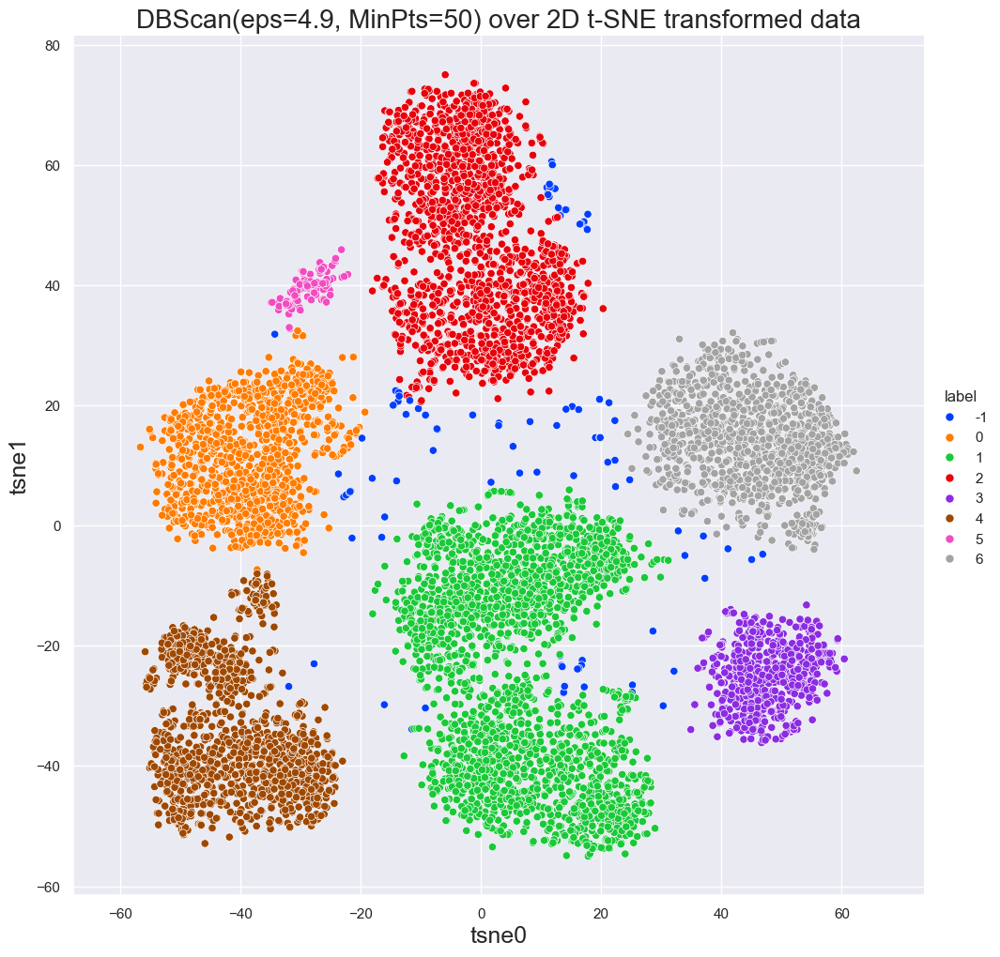

In [173]:
title = f'DBScan(eps={epsilon}, MinPts={min_samples}) over 2D t-SNE transformed data'
Plot2D_WithLabels (samples_TSNE_2D, labels_TSNE_2D, title, axes_TSNE_2D)

### 3.3.4 t-SNE 3D

#### 3.3.4.1 Reducción de Dimensión

In [174]:
tsne3D = TSNE(n_components=3)
samples_TSNE_3D = tsne3D.fit_transform(embeddings_maria)
df_samples_TSNE_3D = pd.DataFrame(data=samples_TSNE_3D, columns=["tsne0", "tsne1", "tsne2"])

#### 3.3.4.2 Modelación Nearest Neighbor

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



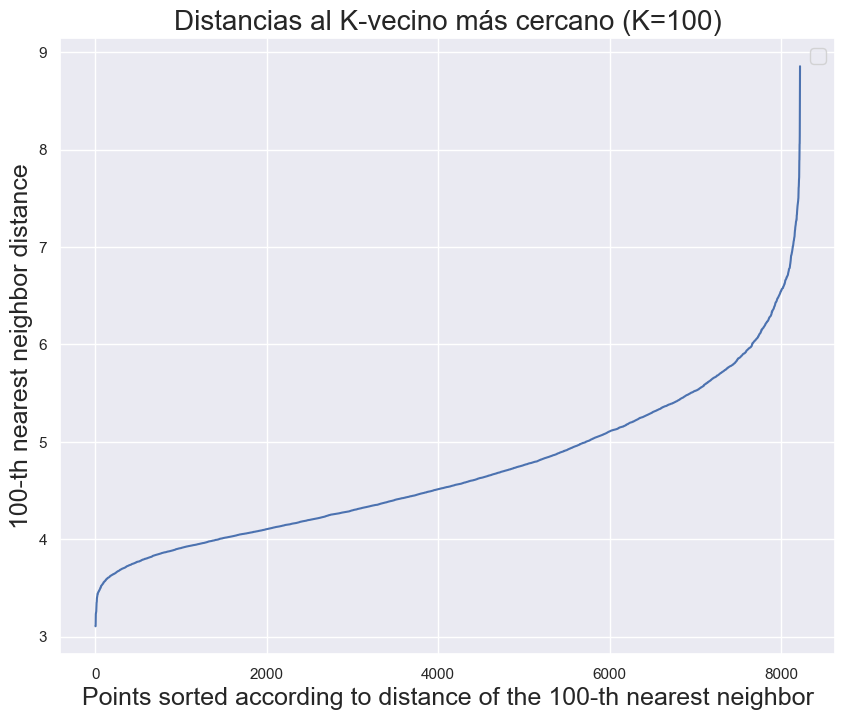

In [175]:
PlotDistancesToKnearestNeighbor(samples_TSNE_3D, 100)

#### 2.3.4.3 DBScan t-SNE 3D

##### 2.3.4.3.1 Epsilons Score Silhouette

In [176]:
min_samples = 100
epsilon_values = [4,4.1,4.2,4.3,4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5, 5.1,5.2]
aux_labels = {}
for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData (samples_TSNE_3D, epsilon, min_samples=min_samples)


Test for epsilon = 4
Estimated number of clusters: 9
Estimated number of noise points: 1935
Silhouette Coefficient: 0.234

Test for epsilon = 4.1
Estimated number of clusters: 9
Estimated number of noise points: 1373
Silhouette Coefficient: 0.290

Test for epsilon = 4.2
Estimated number of clusters: 9
Estimated number of noise points: 905
Silhouette Coefficient: 0.346

Test for epsilon = 4.3
Estimated number of clusters: 9
Estimated number of noise points: 618
Silhouette Coefficient: 0.370

Test for epsilon = 4.4
Estimated number of clusters: 8
Estimated number of noise points: 426
Silhouette Coefficient: 0.375

Test for epsilon = 4.5
Estimated number of clusters: 7
Estimated number of noise points: 318
Silhouette Coefficient: 0.321

Test for epsilon = 4.6
Estimated number of clusters: 7
Estimated number of noise points: 212
Silhouette Coefficient: 0.320

Test for epsilon = 4.7
Estimated number of clusters: 7
Estimated number of noise points: 165
Silhouette Coefficient: 0.318

Test fo

In [177]:
epsilon = 4.4
labels_TSNE_3D = aux_labels[epsilon]

##### 3.3.4.3.2 Visualización DBScan t-SNE 3D

In [178]:
title = f'DBScan(eps={epsilon}, MinPts={min_samples}) over 3D t-SNE transformed data'
axes_TSNE_3D = {'x': 'tsne0', 'y': 'tsne1' , 'z': 'tsne2'}
Plot3D_WithLabels (samples_TSNE_3D, labels_TSNE_3D, title, axes_TSNE_3D)

### 3.3.5 DBScan PCA


#### 3.3.5.1 DBScan - PCA 2D

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



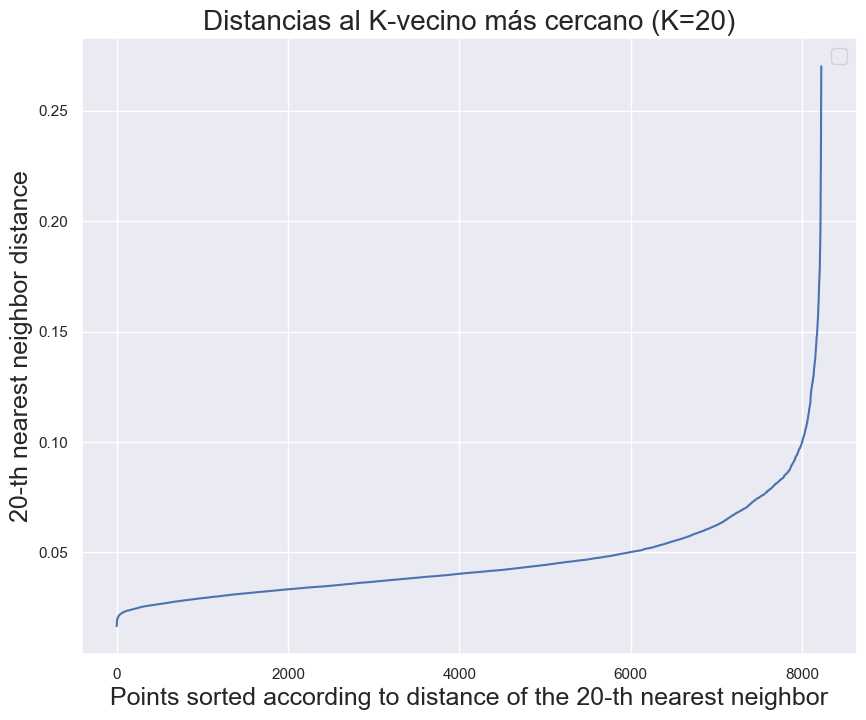

In [179]:
n_samples = 20
PlotDistancesToKnearestNeighbor(df_samples_PCA_2D, n_samples)

In [186]:
min_samples = 20
epsis = [0.025, 0.03,0.09, 0.091, 0.092, 0.093, 0.097, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17]
aux_labels = {}
for epsilon in epsis:
  aux_labels[epsilon] = ApplyDBScanToData (df_samples_PCA_2D, epsilon, min_samples=min_samples)


Test for epsilon = 0.025
Estimated number of clusters: 16
Estimated number of noise points: 7282
Silhouette Coefficient: -0.484

Test for epsilon = 0.03
Estimated number of clusters: 29
Estimated number of noise points: 5786
Silhouette Coefficient: -0.538

Test for epsilon = 0.09
Estimated number of clusters: 1
Estimated number of noise points: 84
Silhouette Coefficient: 0.305

Test for epsilon = 0.091
Estimated number of clusters: 1
Estimated number of noise points: 77
Silhouette Coefficient: 0.306

Test for epsilon = 0.092
Estimated number of clusters: 1
Estimated number of noise points: 74
Silhouette Coefficient: 0.308

Test for epsilon = 0.093
Estimated number of clusters: 1
Estimated number of noise points: 72
Silhouette Coefficient: 0.308

Test for epsilon = 0.094
Estimated number of clusters: 1
Estimated number of noise points: 65
Silhouette Coefficient: 0.308

Test for epsilon = 0.095
Estimated number of clusters: 1
Estimated number of noise points: 59
Silhouette Coefficient: 

In [194]:
epsilon = 0.13
labels_PCA_2D = aux_labels[epsilon]
title = f'DBScan(K={n_clusters}) over 2D PCA transformed data'
Plot2D_WithLabels (df_samples_PCA_2D, labels_PCA_2D, title, axes_PCA_2D, palette="Paired")

KeyError: 0.13

#### 2.3.5.2 DBScan - PCA 3D

C:\Users\diego\AppData\Local\Temp\ipykernel_1900\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



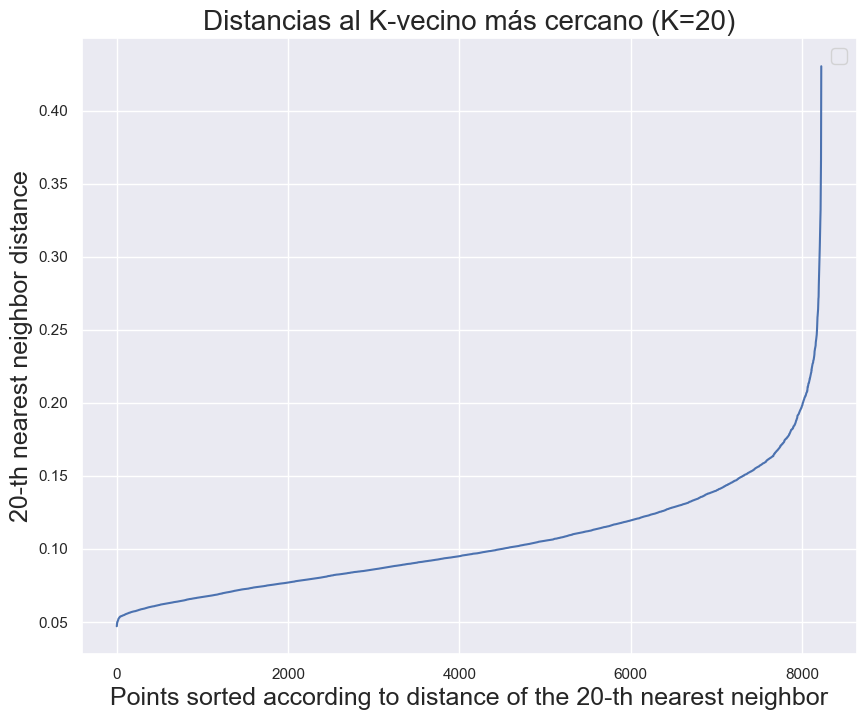

In [187]:
n_samples = 20
PlotDistancesToKnearestNeighbor(df_samples_PCA_3D, n_samples)

In [188]:
epsis = [0.09,0.0945,0.1,0.15,0.16,0.17,0.2]
data_epsis = []
min_samples = n_samples

#epsis = [0.2,0.28,0.29,0.3,0.31,0.32,0.33,0.34,0.35,0.37,0.39,0.4]
aux_labels = {}
for epsilon in epsis:
  aux_labels[epsilon] = ApplyDBScanToData (df_samples_PCA_3D, epsilon, min_samples=min_samples)


Test for epsilon = 0.09
Estimated number of clusters: 9
Estimated number of noise points: 2848
Silhouette Coefficient: -0.174

Test for epsilon = 0.0945
Estimated number of clusters: 7
Estimated number of noise points: 2374
Silhouette Coefficient: -0.035

Test for epsilon = 0.1
Estimated number of clusters: 6
Estimated number of noise points: 1912
Silhouette Coefficient: 0.062

Test for epsilon = 0.15
Estimated number of clusters: 1
Estimated number of noise points: 176
Silhouette Coefficient: 0.161

Test for epsilon = 0.16
Estimated number of clusters: 1
Estimated number of noise points: 99
Silhouette Coefficient: 0.186

Test for epsilon = 0.17
Estimated number of clusters: 1
Estimated number of noise points: 67
Silhouette Coefficient: 0.199

Test for epsilon = 0.2
Estimated number of clusters: 1
Estimated number of noise points: 21
Silhouette Coefficient: 0.207


In [ ]:
epsilon = 0.2
labels_PCA_3D = aux_labels[epsilon]
title = f'K-means(K={n_clusters}) over 3D PCA transformed data'
Plot3D_WithLabels (df_samples_PCA_3D, labels_PCA_3D, title, axes_PCA_3D)